In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Importing libraries

In [1]:
!pip install umap-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 88 kB 3.3 MB/s 
     |████████████████████████████████| 1.1 MB 32.2 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.3-py3-none-any.whl size=82829 sha256=7d56ac446bdc95fc98801ee4b6ceb7e340650a846ed718c6684ee98fdaf6de59
  Stored in directory: /root/.cache/pip/wheels/b3/52/a5/1fd9e3e76a7ab34f134c07469cd6f16e27ef3a37aeff1fe821
  Created wheel for pynndescent: filename=pynndescent-0.5.7-py3-none-any.whl size=54286 sha256=93c79de635b473e8bcffc125db7d84e26d12c27b4c7a5f93a45e6ae765c66061
  Stored in directory: /root/.cache/pip/wheels/7f/2a/f8/7bd5dcec71bd5c669f6f574db3113513696b98f3f9b51f496c
Successfully built umap-learn pynndescent


In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy as sp
from scipy.stats import chi2
from sklearn.covariance import MinCovDet

import copy 

from imblearn.pipeline import Pipeline

from sklearn.decomposition import PCA, FactorAnalysis, FastICA, KernelPCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.manifold import Isomap, LocallyLinearEmbedding, TSNE, MDS
from umap import UMAP

from imblearn.over_sampling import SMOTE, BorderlineSMOTE, SVMSMOTE, ADASYN, KMeansSMOTE

from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier

from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingGridSearchCV, train_test_split, RepeatedStratifiedKFold, cross_val_score, learning_curve, RandomizedSearchCV
from sklearn.feature_selection import RFE, f_classif, SelectKBest, SelectFromModel
from sklearn.metrics import classification_report, fbeta_score, confusion_matrix, precision_recall_curve, auc, plot_precision_recall_curve, make_scorer

from matplotlib import projections
from mpl_toolkits import mplot3d

## 1. Loading data

### 1.1. Read data

In [3]:
bank_data = pd.read_csv('/content/drive/MyDrive/Applied Statistics Project/project_appstats/data/data.csv')

FileNotFoundError: ignored

In [ ]:
pd.set_option('display.max_columns', None)

In [ ]:
bank_data.head()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,1.256969e-04,0.0,0.458143,0.000725,0.0,0.147950,0.147950,0.147950,0.169141,0.311664,0.017560,0.095921,0.138736,0.022102,0.848195,0.688979,0.688979,0.217535,4.980000e+09,0.000327,0.263100,0.363725,0.002259,0.001208,0.629951,0.021266,0.207576,0.792424,0.005024,0.390284,0.006479,0.095885,0.137757,0.398036,0.086957,0.001814,0.003487,1.820926e-04,1.165007e-04,0.032903,0.034164,0.392913,0.037135,0.672775,0.166673,0.190643,0.004094,0.001997,1.473360e-04,0.147308,0.334015,0.276920,0.001036,0.676269,0.721275,0.339077,0.025592,0.903225,0.002022,0.064856,7.010000e+08,6.550000e+09,0.593831,4.580000e+08,0.671568,0.424206,0.676269,0.339077,0.126549,0.637555,0.458609,0.520382,0.312905,0.118250,0,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,2.897851e-04,0.0,0.461867,0.000647,0.0,0.182251,0.182251,0.182251,0.208944,0.318137,0.021144,0.093722,0.169918,0.022080,0.848088,0.689693,0.689702,0.217620,6.110000e+09,0.000443,0.264516,0.376709,0.006016,0.004039,0.635172,0.012502,0.171176,0.828824,0.005059,0.376760,0.005835,0.093743,0.168962,0.397725,0.064468,0.001286,0.004917,9.360000e+09,7.190000e+08,0.025484,0.0068

In [ ]:
bank_data.shape

(6819, 96)

It seems that the dataset has been scaled, let's check this

In [ ]:
(np.max(bank_data, axis=0) > 0.999).sum()

96

In [ ]:
(np.min(bank_data, axis=0) < 0.001).sum()

95

$\Rightarrow$ We can see that the dataset has been scaled

## 2. EDA

### 2.1. Check data information

In [ ]:
bank_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Bankrupt?                                                 6819 non-null   int64  
 1    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2    ROA(A) before interest and % after tax                   6819 non-null   float64
 3    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4    Operating Gross Margin                                   6819 non-null   float64
 5    Realized Sales Gross Margin                              6819 non-null   float64
 6    Operating Profit Rate                                    6819 non-null   float64
 7    Pre-tax net Interest Rate                                6819 non-null   float64
 8    After-tax net Int

Through data.info(), we observed that we have a majority of "float64" data. The categorical data is distinguished as binary 1 and 0, thus stored as "int64". So, we first analize three features which datatype are "int64"

### 2.2. Features Overview

In [ ]:
strange_features = bank_data.dtypes[bank_data.dtypes == "int64"].index
numeric_features = bank_data.dtypes[bank_data.dtypes == "float64"].index

print(bank_data[strange_features].columns.tolist())
print(len(strange_features))
print(len(numeric_features))

['Bankrupt?', ' Liability-Assets Flag', ' Net Income Flag']
3
93


- Liability-Assets Flag compared to Bankrupt

 Liability-Assets Flag  Bankrupt?
0                       0            6597
                        1             214
1                       1               6
                        0               2
dtype: int64


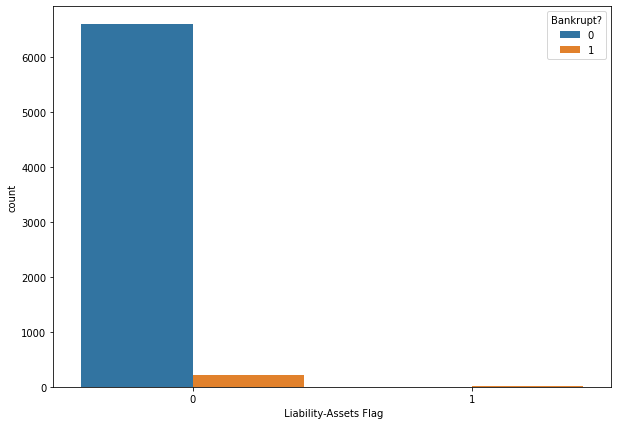

In [ ]:
print(bank_data[[" Liability-Assets Flag", "Bankrupt?"]].value_counts())
print("=======================")
plt.figure(figsize=(10, 7))
sns.countplot(x=" Liability-Assets Flag", hue="Bankrupt?", data=bank_data)

Explaination of `Liability-Assets`:
+ The `Liability-Assets` flag denotes the status of an organization, where if the `total liability exceeds total assets`, the flagged value will be 1, else the value is 0. A majority number of times, organizations/company's assets are more than their liabilities.

Brief:
+ A small portion of organizations suffers bankruptcy, although possessing more assets than their liabilities.

- Net Income Flag compared to Bankrupt

 Net Income Flag  Bankrupt?
1                 0            6599
                  1             220
dtype: int64


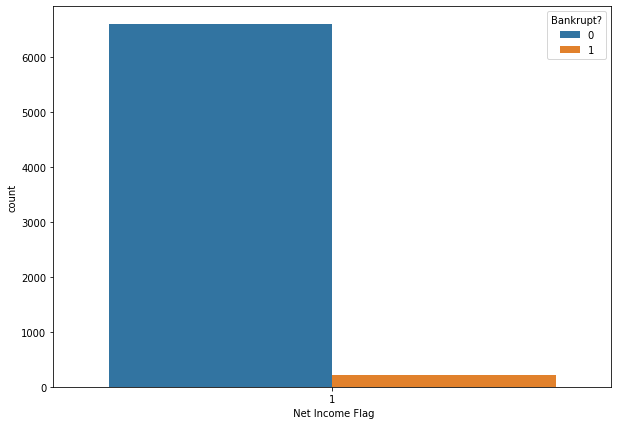

In [ ]:
print(bank_data[[" Net Income Flag", "Bankrupt?"]].value_counts())
print("=======================")
plt.figure(figsize=(10, 7))
sns.countplot(x=" Net Income Flag", hue="Bankrupt?", data=bank_data)

Explaination of `Net Income`:
+ The `Net Income` flag denotes the `status of an organization's income` in the last two years, where if the net income is negative for the past two years, the flagged value will be 1, else the value is 0. We observe that all the records have been exhibiting a loss for the past two years.

Brief:
* Many organizations that have suffered losses for the past two years have stabilized their business, thus avoiding bankruptcy.

## 3. Details analysis

### 3.1. Data description

In [ ]:
bank_data.describe()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.0,6819.000000
mean,0.032263,0.505180,0.558625,0.553589,0.607948,0.607929,0.998755,0.797190,0.809084,0.303623,0.781381,1.995347e+09,1.950427e+09,0.467431,1.644801e+07,0.11

### 3.2. Checking NAN

In [ ]:
[col for col in bank_data if bank_data[col].isnull().sum() > 0]

[]

$\Rightarrow$ There's no missing data

### 3.3. Checking duplicates

In [ ]:
bank_data.duplicated().sum()

0

$\Rightarrow$ There's no duplicated rows

### 3.4. Checking objective column

In [ ]:
bank_data['Bankrupt?'].value_counts()

0    6599
1     220
Name: Bankrupt?, dtype: int64

In [ ]:
print(f"Financially stable: {round(bank_data['Bankrupt?'].value_counts()[0]/len(bank_data) * 100,2)} %")
print(f"Financially unstable: {round(bank_data['Bankrupt?'].value_counts()[1]/len(bank_data) * 100,2)} %")

Financially stable: 96.77 %
Financially unstable: 3.23 %


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0.5, 1.0, 'Class Distributions \n (0: Financially Stable || 1: Financially Unstable)')

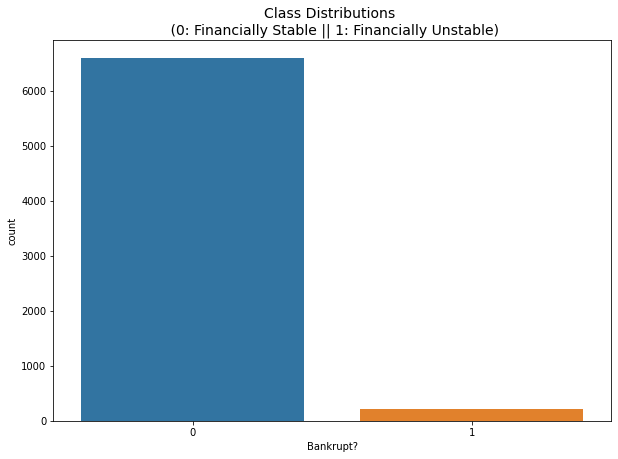

In [ ]:
plt.figure(figsize=(10, 7))
sns.countplot(bank_data['Bankrupt?'])
plt.title('Class Distributions \n (0: Financially Stable || 1: Financially Unstable)', fontsize=14)

$\Rightarrow$ We see that the dataset is highly imbalanced

### 3.5. Seeing correlations between columns

#### Corelations between features and target column

 Net Income to Total Assets                                -0.315457
 ROA(A) before interest and % after tax                    -0.282941
 ROA(B) before interest and depreciation after tax         -0.273051
 ROA(C) before interest and depreciation before interest   -0.260807
 Net worth/Assets                                          -0.250161
                                                              ...   
 Current Liability to Current Assets                        0.171306
 Borrowing dependency                                       0.176543
 Current Liability to Assets                                0.194494
 Debt ratio %                                               0.250161
 Net Income Flag                                                 NaN
Name: Bankrupt?, Length: 95, dtype: float64


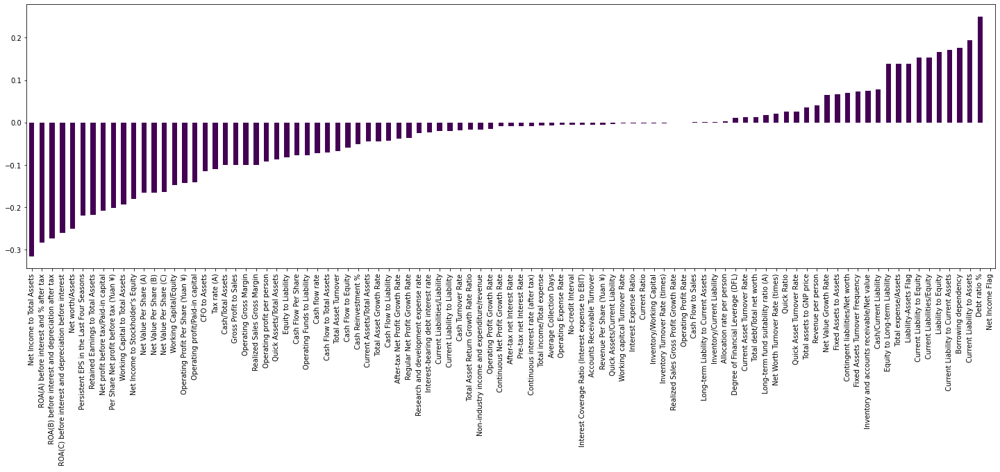

In [ ]:
plt.figure(figsize=(25, 7))
print(bank_data.corr()['Bankrupt?'].sort_values().drop('Bankrupt?'))
bank_data.corr()['Bankrupt?'].sort_values().drop('Bankrupt?').plot(kind='bar', cmap='viridis')

- All features have low corelation with target variable (absolute value < 0.35) 

- Many featues, for instance 'Operating Profit Rate', 'Realized Sales Fross Profit Growth Rate' and 'Cash Flow To Sales', have nearly 0 corelation with target variable

- Feature 'Net Income Flag' has no corelation (NaN) with target variable 

#### Corelation between features

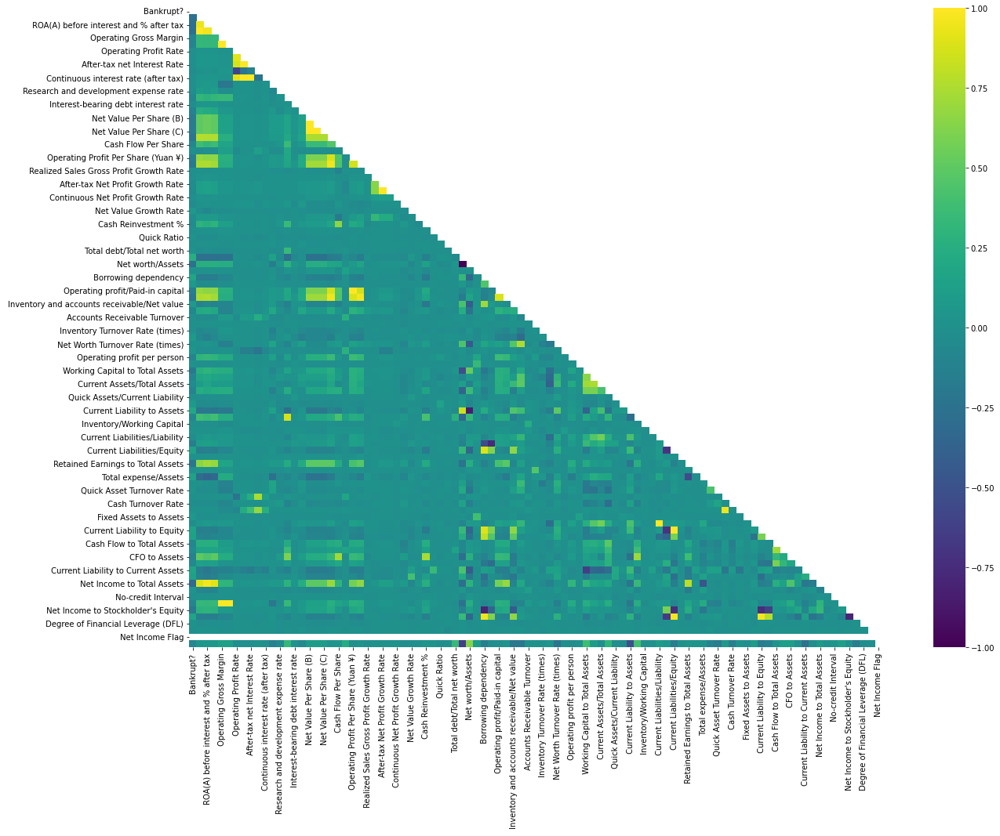

In [ ]:
plt.figure(figsize=(20, 15))
mask = np.zeros_like(bank_data.corr())
mask[np.triu_indices_from(mask)] = True
sns.heatmap(bank_data.corr(), mask=mask, cmap='viridis')

In [ ]:
correlation_matrix = bank_data.corr().abs()
unstack_corr = correlation_matrix.unstack()
unstack_corr = unstack_corr.sort_values(ascending=False)

corr_df = pd.DataFrame(unstack_corr).drop_duplicates().reset_index()
corr_df.columns = ['feature 1', 'feature 2', 'corr']

# check pairs of feature having corr > 0.8
condition1 = corr_df['corr'] > 0.8
condition2 = corr_df['feature 1'] != corr_df['feature 2']
corr_df[condition1 & condition2]

,feature 1,feature 2,corr
1,Net worth/Assets,Debt ratio %,1.000000
2,Gross Profit to Sales,Operating Gross Margin,1.000000
3,Net Value Per Share (C),Net Value Per Share (A),0.999837
4,Operating Gross Margin,Realized Sales Gross Margin,0.999518
5,Gross Profit to Sales,Realized Sales Gross Margin,0.999518
6,Net Value Per Share (A),Net Value Per Share (B),0.999342
7,Net Value Per Share (C),Net Value Per Share (B),0.999179
8,Operating Profit Per Share (Yuan ¥),Operating profit/Paid-in capital,0.998696
9,Regular Net Profit Growth Rate,After-tax Net Profit Growth Rate,0.996186
10,Continuous interest rate (after tax),Pre-tax net Interest Rate,0.993617


There are much duplicated infomation among features

- Let's analyze the top ten positively and negatively correlated attributes.

In [ ]:
positive_corr = bank_data[numeric_features].corrwith(bank_data["Bankrupt?"]).sort_values(ascending=False)[:10].index.tolist()
negative_corr = bank_data[numeric_features].corrwith(bank_data["Bankrupt?"]).sort_values()[:10].index.tolist()
positive_corr_df = bank_data[positive_corr + ["Bankrupt?"]]
negative_corr_df = bank_data[negative_corr + ["Bankrupt?"]]

In [ ]:
def corr_barplot(x_value, y_value):
    plt.figure(figsize=(15, 25))
    for i in range(1, 11):
        plt.subplot(5, 2, i)
        sns.barplot(x=x_value, y=y_value[i - 1], data=bank_data)

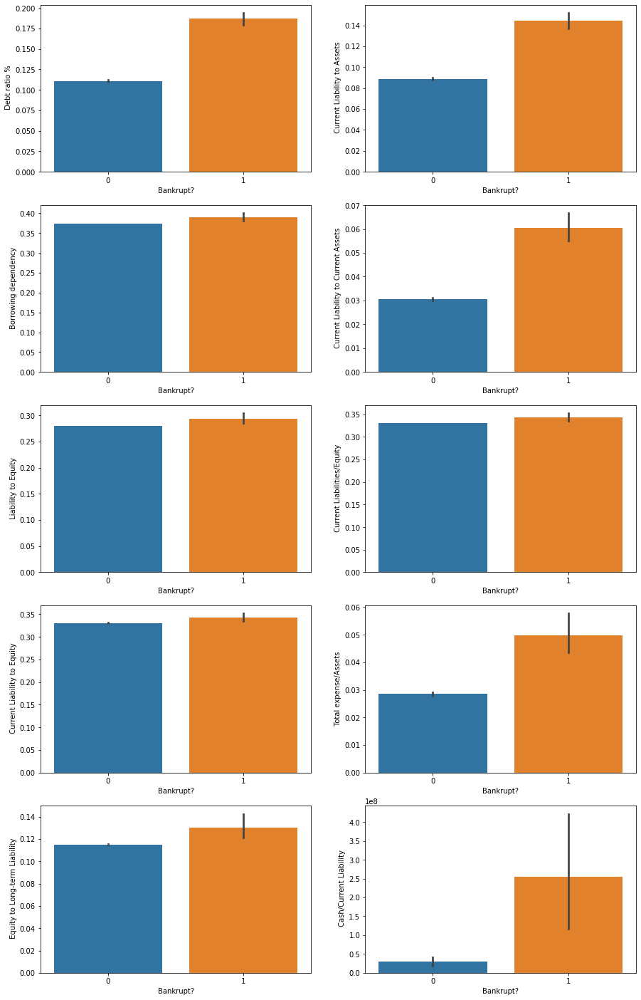

In [ ]:
x_value = positive_corr_df.columns.tolist()[-1]
y_value = positive_corr_df.columns.tolist()[:-1]
corr_barplot(x_value, y_value)

$\Rightarrow$ We see that three attributes - `Debt Ratio %`, `Current Liability To Assets`, `Current Liability To Current Assets` are commonly high in bankrupt organizations

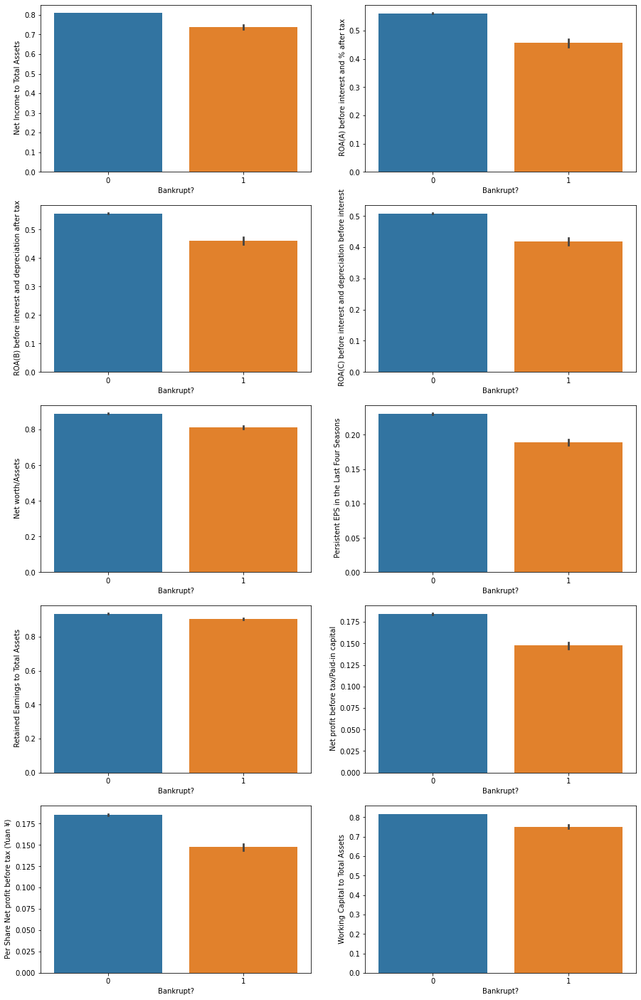

In [ ]:
x_value = negative_corr_df.columns.tolist()[-1]
y_value = negative_corr_df.columns.tolist()[:-1]

corr_barplot(x_value, y_value)

These attributes show us that the more the `assets` and `earing of a company`, the less likely is `the organization to be bankrupt`.

Let us check the relation of top ten positive and negative correlation attributes among each other

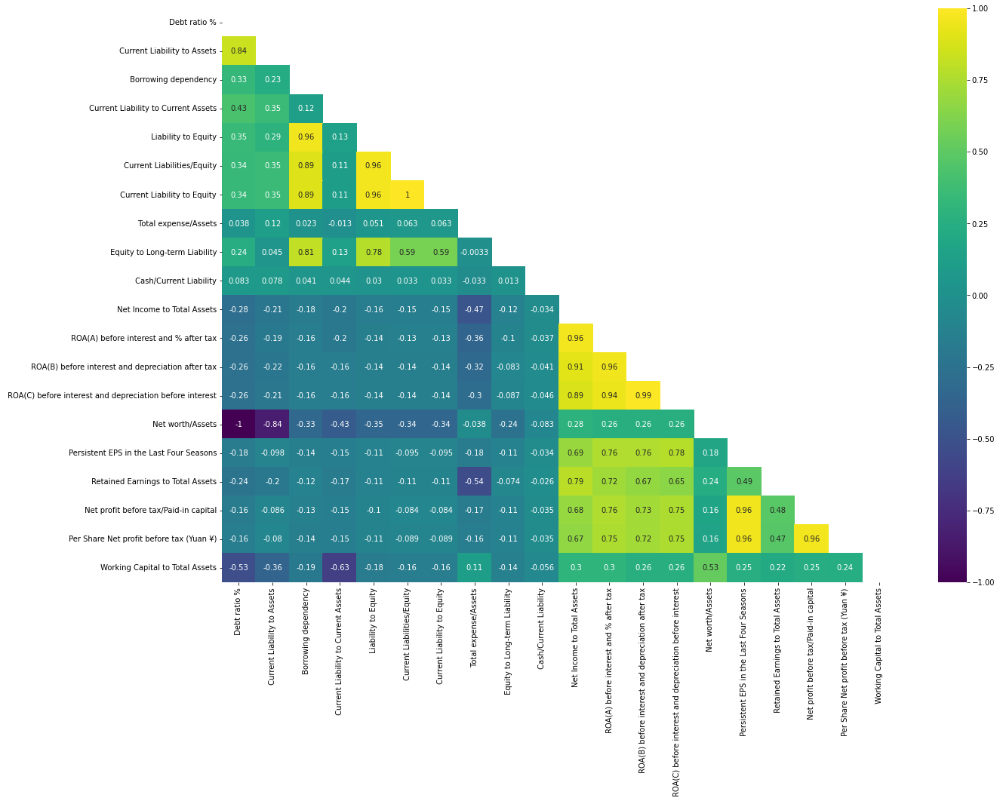

In [ ]:
relation = positive_corr + negative_corr
plt.figure(figsize=(20, 14))
mask = np.zeros_like(bank_data[relation].corr())
mask[np.triu_indices_from(mask)] = True
sns.heatmap(bank_data[relation].corr(), mask=mask, annot=True, cmap='viridis')

### 3.6. Checking single valued features

In [ ]:
feature_value_counts = []
for feature in bank_data.columns[1:]:
    feature_value_counts.append([feature, bank_data[feature].value_counts().shape[0]])
feature_value_counts = sorted(feature_value_counts, key=lambda x: x[1])

In [ ]:
single_valued_features = [feature[0] for feature in feature_value_counts if feature[1] == 1]
print(single_valued_features)

We will drop this feature because it has no effect on our model

In [ ]:
bank_data = bank_data.drop(columns=single_valued_features)

### 3.7 Checking distribution and outliers in each feature

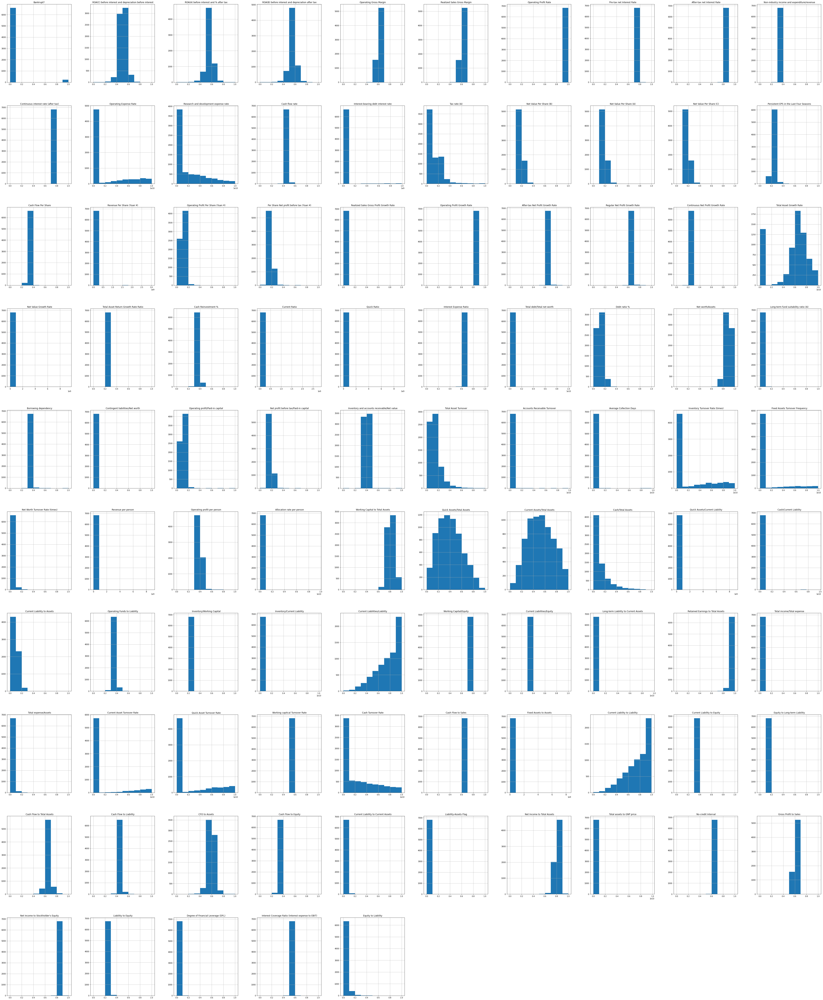

In [ ]:
bank_data.hist(figsize=(80, 100))
plt.show()

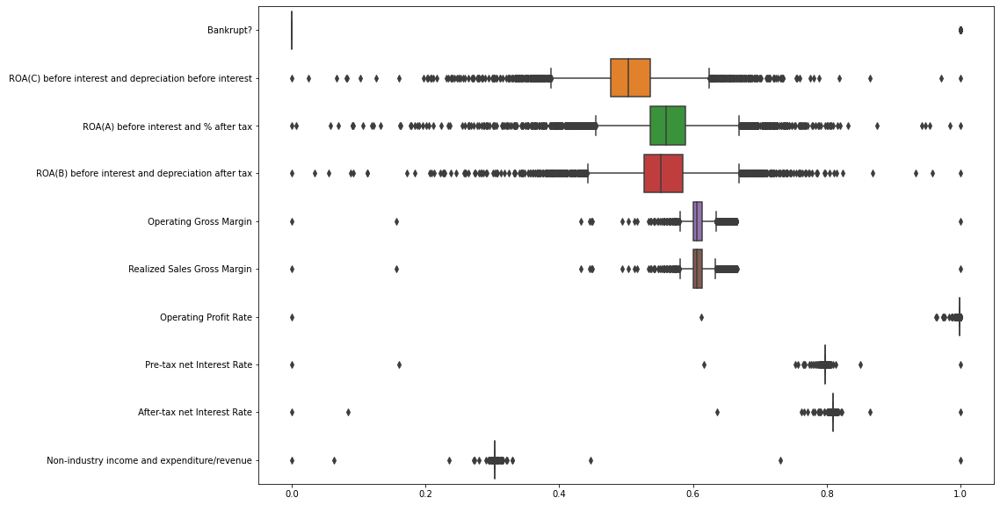

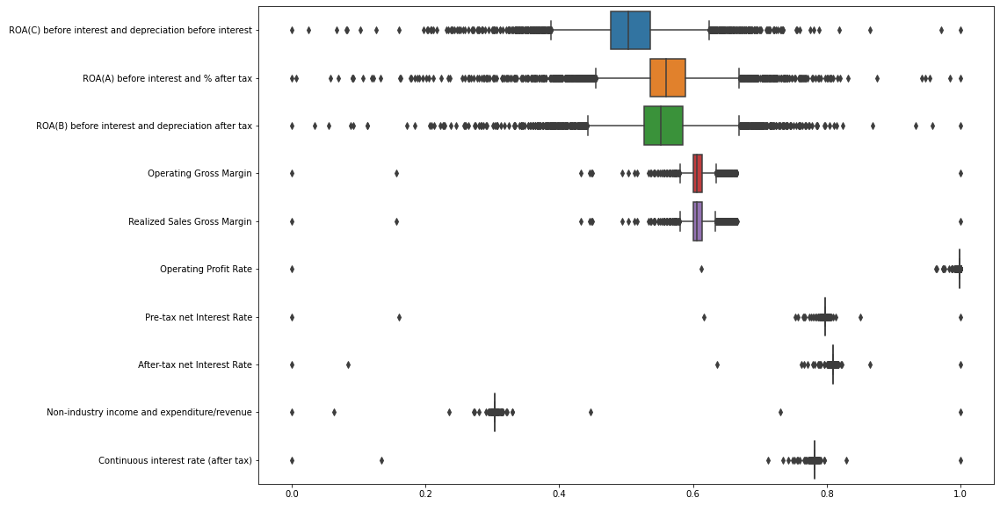

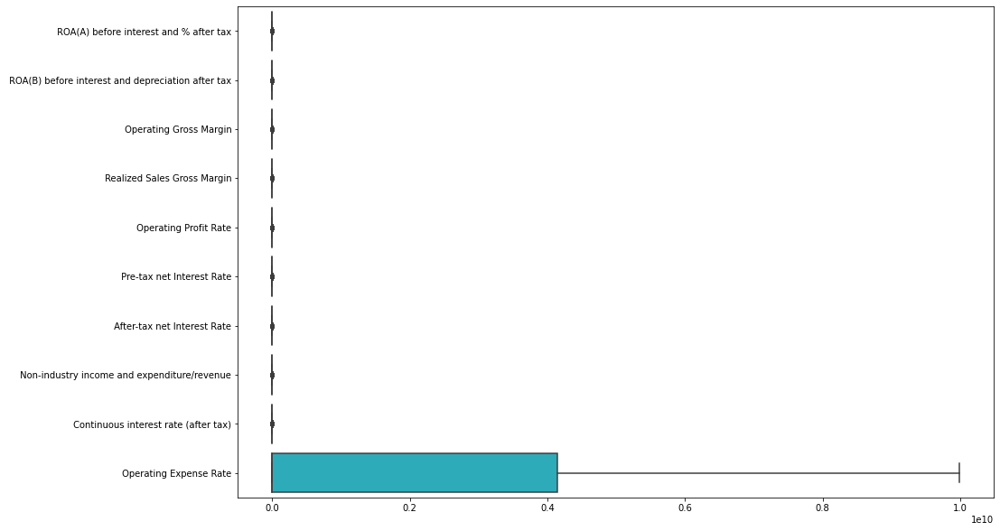

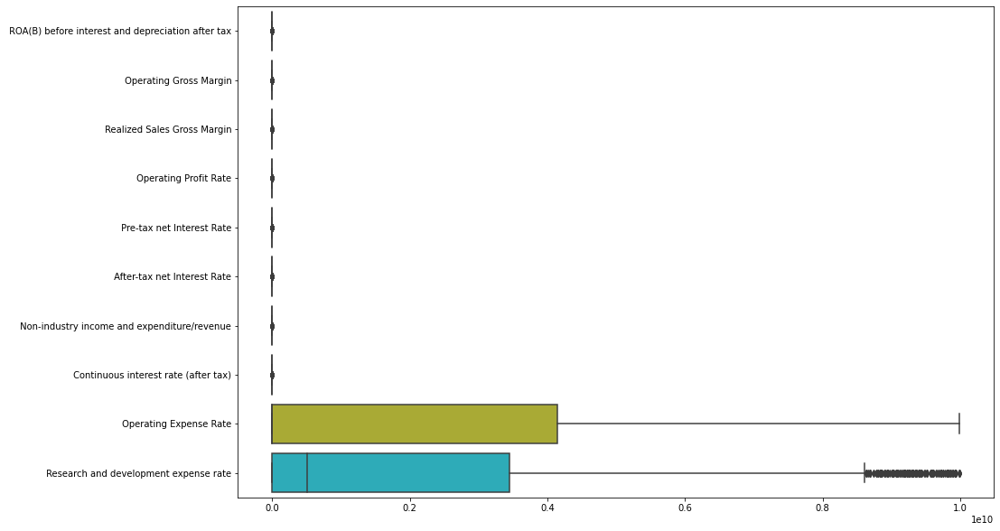

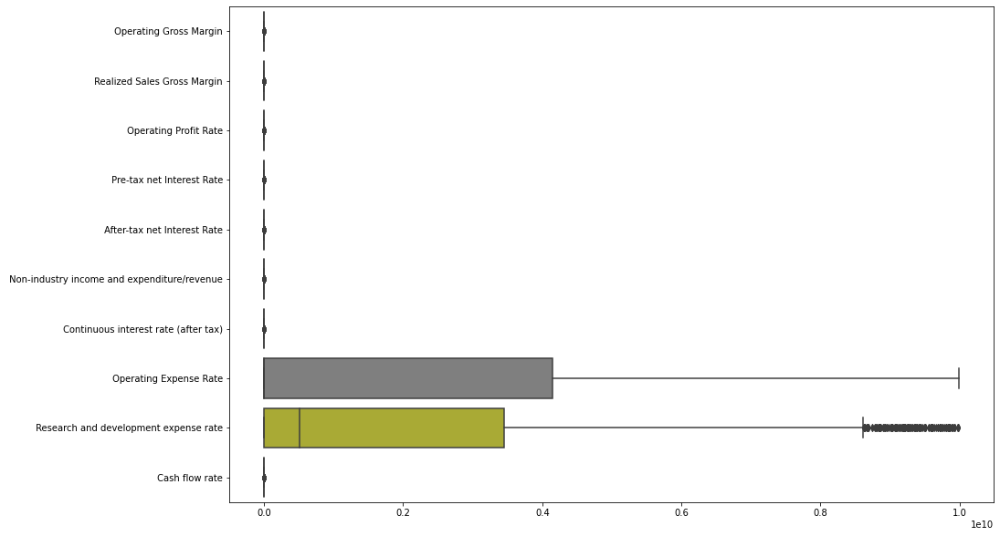

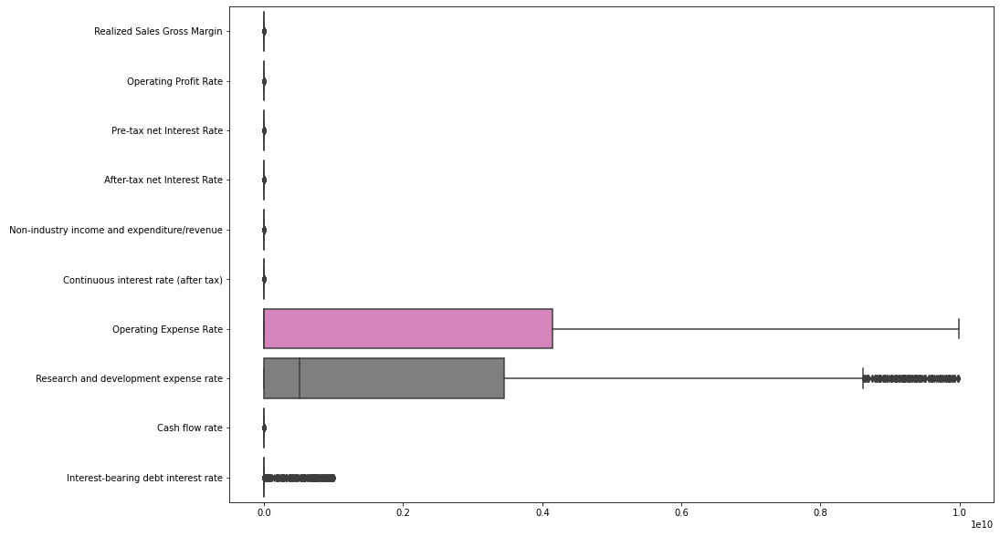

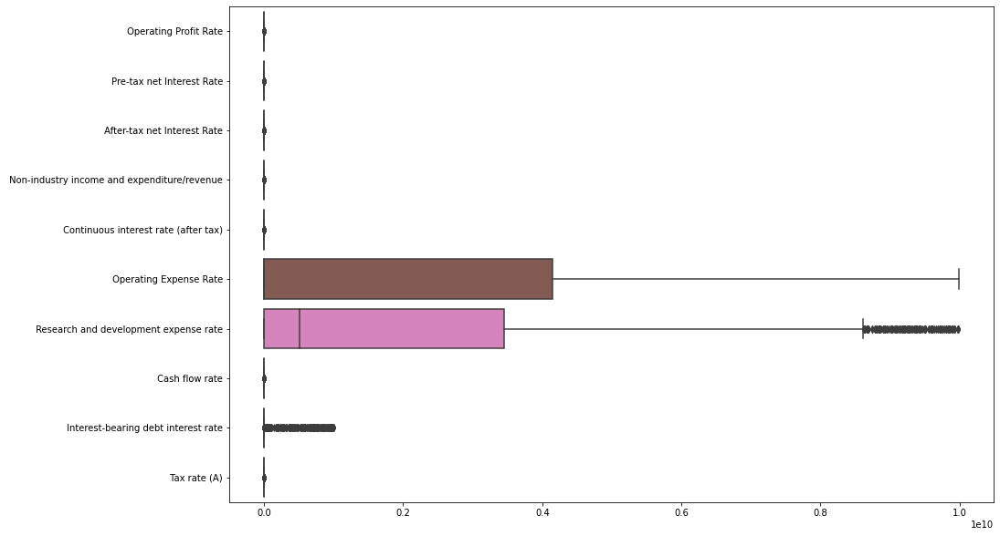

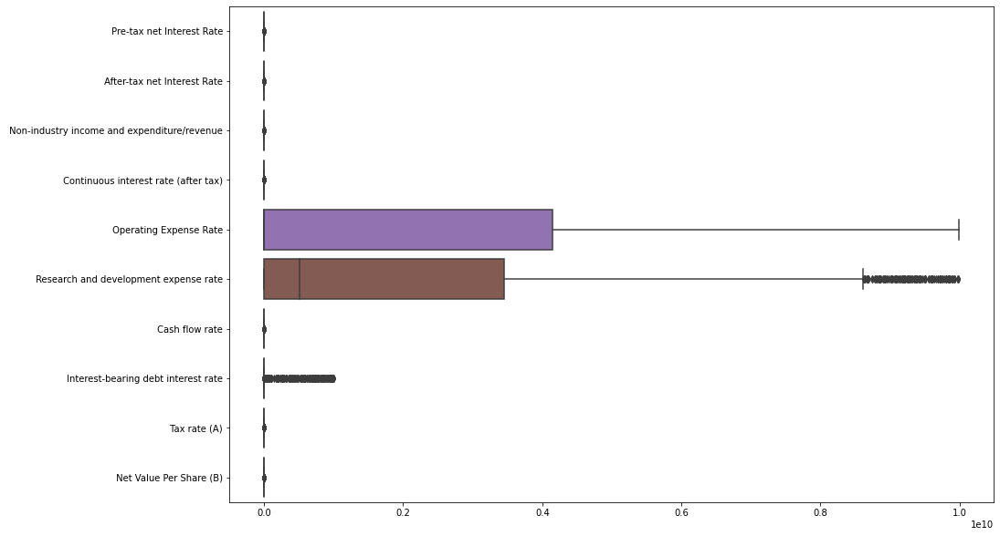

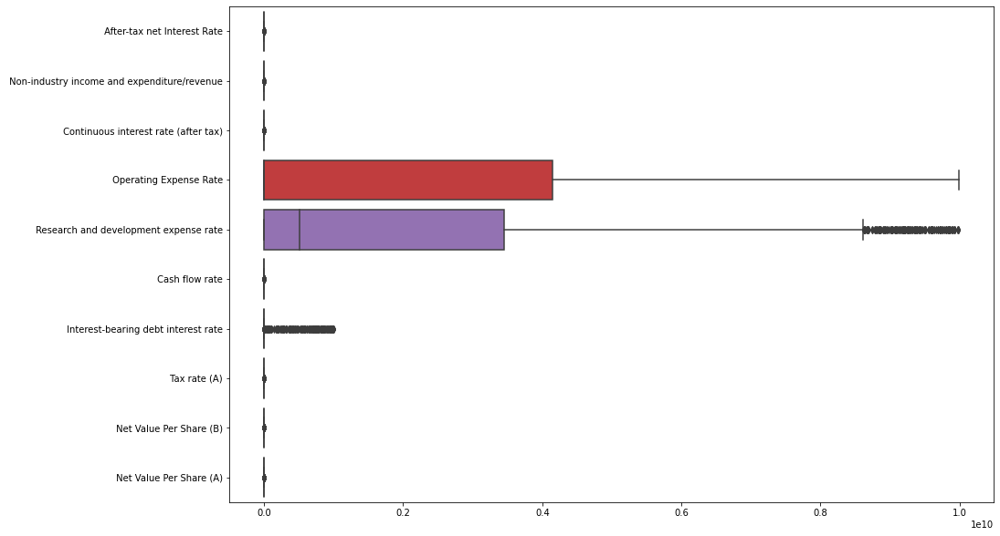

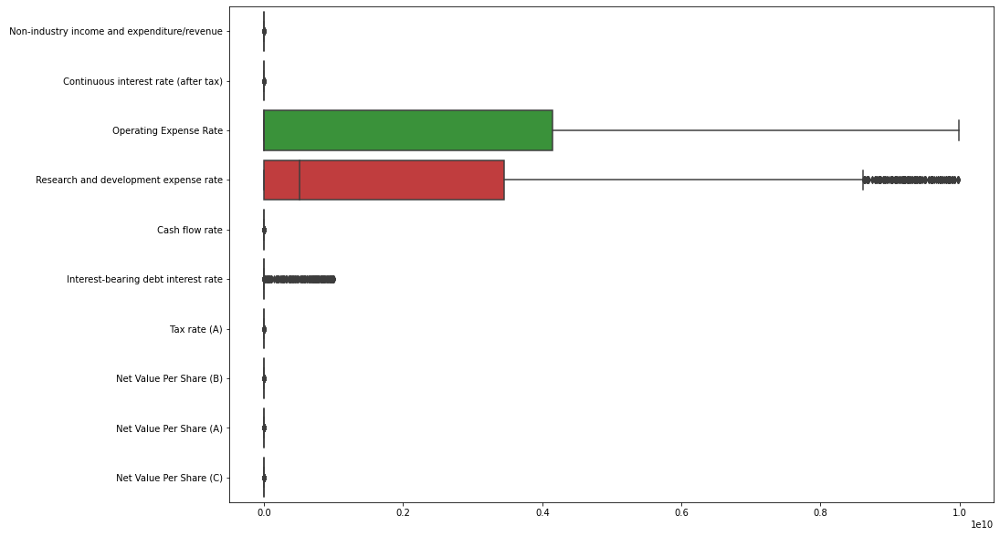

In [ ]:
for i in range(10):
    plt.figure(figsize=(15, 10))
    sns.boxplot(data=bank_data.iloc[:, i: i + 10], orient='h')
    plt.show()

Most of the data is rich on outliers, and in some other the values are located in just one bin !!!

Because our topic doesn't cover outliers handling => we don't go further here

## Summary of Analysis

### About data

- This dataset is fairly small (6819 observations) and has been scaled
- There is no missing value and duplicated rows
- Features are highly corelated with each other while we find no remarkable corelations between them and the target variable
- Data is highly imbalanced in target varible with nearly 97% of class 0 (non-bankrupt)
- Most of the data is rich on outliers, and in some other the values are located in just one bin

### Some conclusions

- The number of organizations that have gone bankrupt in 10 years between 1999 – 2000 is few.
- Several companies possess many assets, which is always a good sign for an organization.
- An organization cannot guarantee not being bankrupt, although owning several assets.
- The organizations in the dataset are running into losses for the past two years as their net income poses to be negative.
- Very few of the organizations that have had negative income in the past two years suffer from bankruptcy.
- It is observed that “Debt Ratio %, Current Liability To Assets, Current Liability To Current Assets" attributes are a few of the attributes that have a high correlation with the target attribute.
- An increase in the values of the attributes “Debt Ratio %, Current Liability To Assets, Current Liability To Current Assets” causes an organization to suffer heavy - losses, thus resulting in bankruptcy.
- An increase in the values of the attributes that have a negative correlation with the target attribute helps an organization avoid bankruptcy.
- There seems to be a relation between attributes that have a high correlation with the target attribute and a low correlation with the target attribute.
- We observed several correlations among the top 20 attributes, one of which being “Net Worth/Assets and Debt Ratio %” that is negatively correlated with one another.

## 4. Data processing

### 4.0. Prepare parameters

In [ ]:
# Features and label
features = bank_data.columns[1:]
X = bank_data[features]
y = bank_data["Bankrupt?"]

In [ ]:
# train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

In [ ]:
# Need to refresh param_grid when using new pipeline
param_grid = {}

### 4.1. Handling imbalanced data

#### SMOTE

In [ ]:
smote = ('smote', SMOTE(sampling_strategy=1.0, random_state=42))
#param_grid['smote__sampling_strategy']   = np.arange(0.8, 1.01, 0.05)
#param_grid['smote__k_neighbors']         = np.arange(3, 11, 1)

#### BorderlineSMOTE

In [ ]:
borderline_smote = ('borderline_smote', BorderlineSMOTE(sampling_strategy=1.0, random_state=42))
#param_grid['borderline_smote__sampling_strategy']   = np.arange(0.8, 1.01, 0.05)
#param_grid['borderline_smote__k_neighbors']         = [3, 5, 8, 10, 12]
#param_grid['borderline_smote__m_neighbors']         = [5, 10, 12, 15, 18]
#param_grid['borderline_smote__kind']                = ["borderline-1", "borderline-2"]

#### SVMSMOTE

In [ ]:
svm_smote = ('svm_smote', SVMSMOTE(sampling_strategy=1.0, random_state=42))
#param_grid['svm_smote__sampling_strategy']   = np.arange(0.8, 1.01, 0.05)
#param_grid['svm_smote__k_neighbors']         = [3, 5, 8, 10, 12]
#param_grid['svm_smote__m_neighbors']         = [5, 10, 12, 15, 18]

#### ADASYN

In [ ]:
adasyn = ('adasyn', ADASYN(sampling_strategy=1.0, random_state=42))
#param_grid['adasyn__sampling_strategy'] = np.arange(0.8, 1.01, 0.05)
#param_grid['adasyn__n_neighbors']       = [3, 5, 8, 10, 12]

### 4.2. High dimention handling

- We will visualize effects of dimentionality reduction techniques by reducing the dimention of data to 2D and 3D

#### 4.2.1. Dimentionality Reduction

##### Linear methods

######  Principal Component Analysis (PCA)

- 2 components

In [ ]:
pca_2 = PCA(n_components=2, random_state=42)
pca_2.fit(X_train)
X_pca_2 = pca_2.transform(X_train)

In [ ]:
np.cumsum(pca_2.explained_variance_ratio_ * 100)

array([22.21722303, 37.8756095 ])

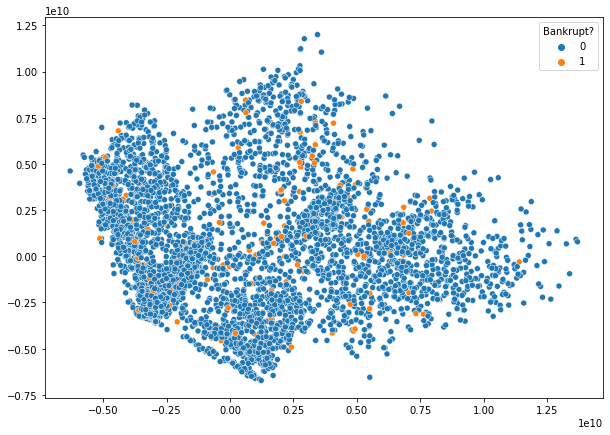

In [ ]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_pca_2[:, 0], y=X_pca_2[:, 1], hue=y_train)
plt.show()

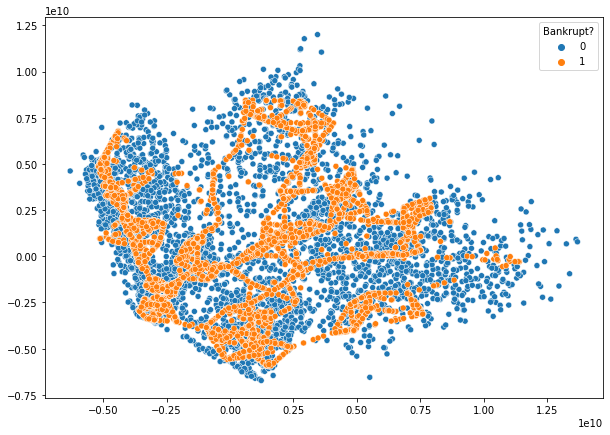

In [ ]:
X_pca_2_smote, y_pca_2_smote = SMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_pca_2, y_train)
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_pca_2_smote[:, 0], y=X_pca_2_smote[:, 1], hue=y_pca_2_smote)
plt.show()

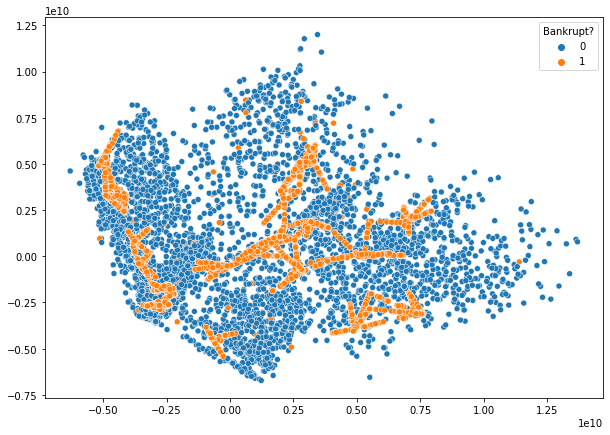

In [ ]:
X_pca_2_smote, y_pca_2_smote = SVMSMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_pca_2, y_train)
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_pca_2_smote[:, 0], y=X_pca_2_smote[:, 1], hue=y_pca_2_smote)
plt.show()

- 3 components

In [ ]:
pca_3 = PCA(n_components=3, random_state=42)
pca_3.fit(X_train)
X_pca_3 = pca_3.transform(X_train)

In [ ]:
np.cumsum(pca_3.explained_variance_ratio_ * 100)

array([22.21722303, 37.8756095 , 50.23863515])

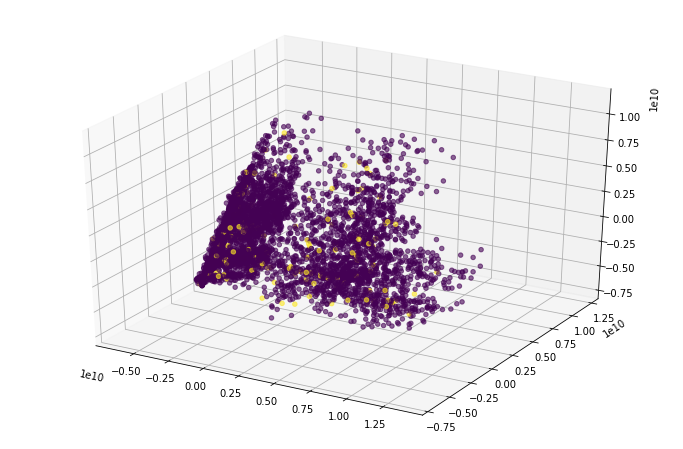

In [ ]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection='3d')

sctt = ax.scatter3D(X_pca_3[:, 0], X_pca_3[:, 1], X_pca_3[:, 2],
                      c = y_train, alpha=0.6)
plt.show()

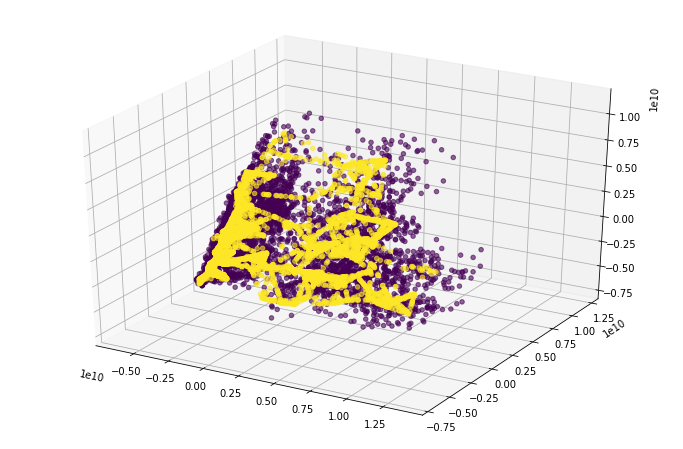

In [ ]:
X_pca_3_smote, y_pca_3_smote = SMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_pca_3, y_train)
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection='3d')

sctt = ax.scatter3D(X_pca_3_smote[:, 0], X_pca_3_smote[:, 1], X_pca_3_smote[:, 2],
                      c = y_pca_3_smote, alpha=0.6)
plt.show()

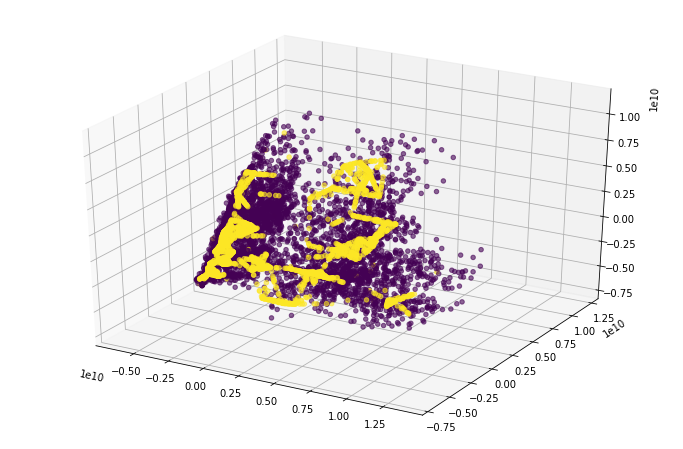

In [ ]:
X_pca_3_smote, y_pca_3_smote = SVMSMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_pca_3, y_train)
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection='3d')

sctt = ax.scatter3D(X_pca_3_smote[:, 0], X_pca_3_smote[:, 1], X_pca_3_smote[:, 2],
                      c = y_pca_3_smote, alpha=0.6)
plt.show()

- Keep 99.99% variability

In [ ]:
pca_9999 = PCA(n_components=0.99, random_state=42)
pca_9999.fit(X_train)
X_pca_9999 = pca_9999.transform(X_train)

In [ ]:
X_pca_9999.shape

(5455, 11)

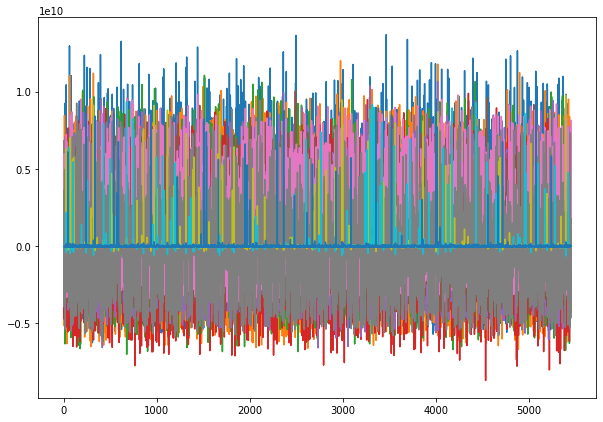

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(X_pca_9999)

Text(0.5, 1.0, 'Component-wise and Cumulative Explained Variance')

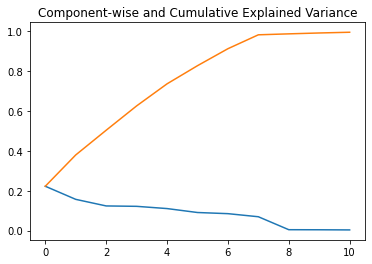

In [ ]:
plt.plot(range(11), pca_9999.explained_variance_ratio_)
plt.plot(range(11), np.cumsum(pca_9999.explained_variance_ratio_))
plt.title("Component-wise and Cumulative Explained Variance")

Through PCA, we keep 99.99% variability of data with just 11 features

###### Factor Analysis

- 2 components

In [ ]:
fa_2 = FactorAnalysis(n_components=2, random_state=42)
fa_2.fit(X_train)
X_fa_2 = fa_2.transform(X_train)

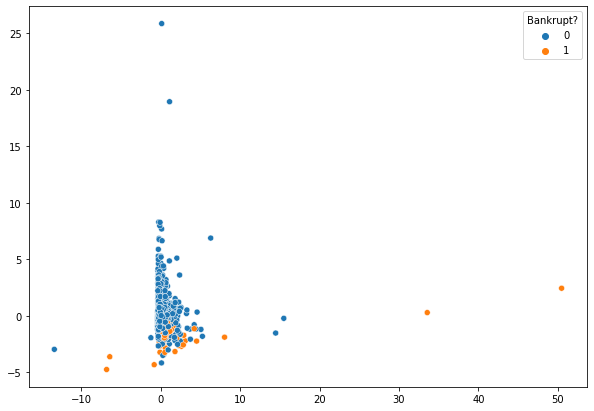

In [ ]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_fa_2[:, 0], y=X_fa_2[:, 1], hue=y_train)
plt.show()

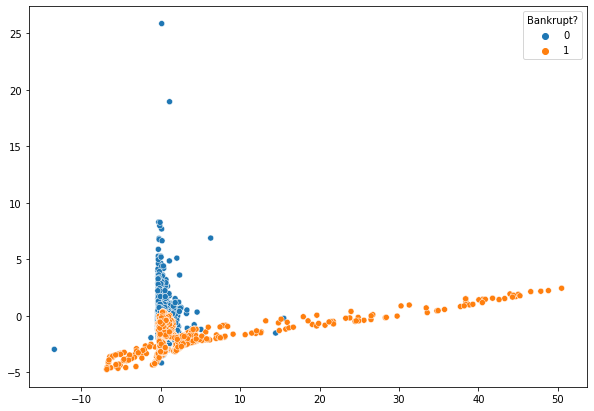

In [ ]:
X_fa_2_smote, y_fa_2_smote = SMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_fa_2, y_train)
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_fa_2_smote[:, 0], y=X_fa_2_smote[:, 1], hue=y_fa_2_smote)
plt.show()

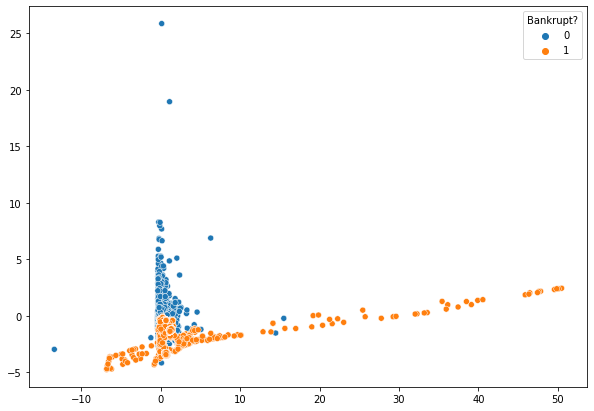

In [ ]:
X_fa_2_smote, y_fa_2_smote = SVMSMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_fa_2, y_train)
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_fa_2_smote[:, 0], y=X_fa_2_smote[:, 1], hue=y_fa_2_smote)
plt.show()

- 3 components

In [ ]:
fa_3 = FactorAnalysis(n_components=3, random_state=42)
fa_3.fit(X_train)
X_fa_3 = fa_3.transform(X_train)

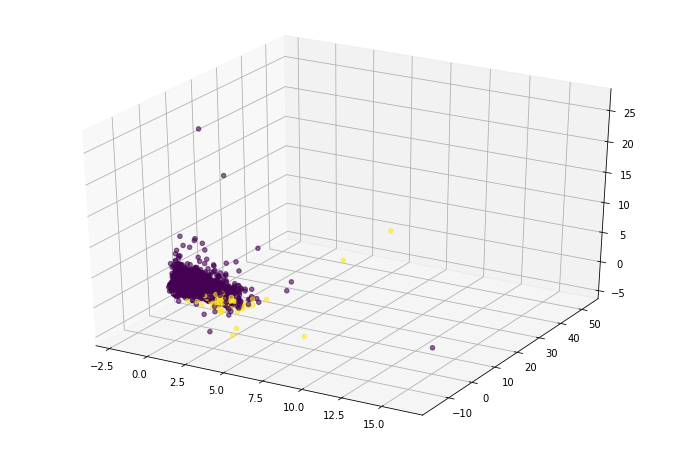

In [ ]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection='3d')

sctt = ax.scatter3D(X_fa_3[:, 0], X_fa_3[:, 1], X_fa_3[:, 2],
                      c = y_train, alpha=0.6)
plt.show()

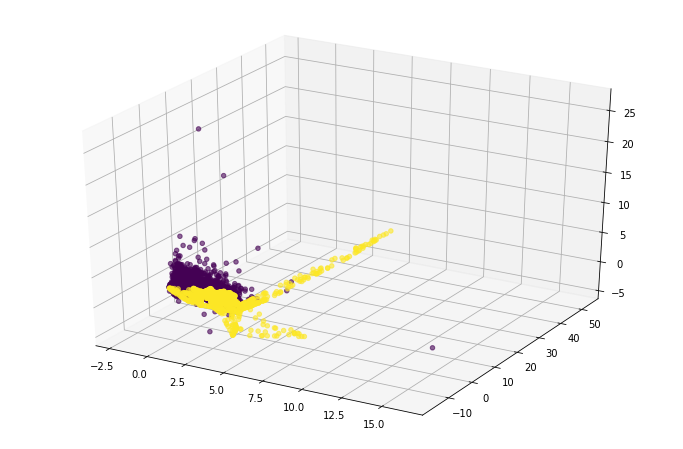

In [ ]:
X_fa_3_smote, y_fa_3_smote = SMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_fa_3, y_train)
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection='3d')

sctt = ax.scatter3D(X_fa_3_smote[:, 0], X_fa_3_smote[:, 1], X_fa_3_smote[:, 2],
                      c = y_fa_3_smote, alpha=0.6)
plt.show()

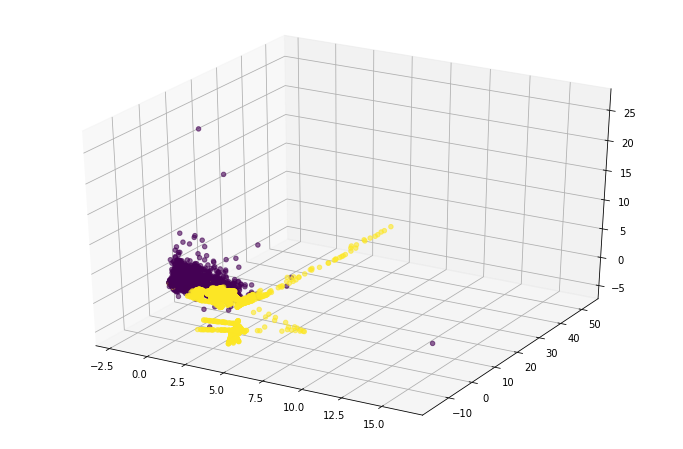

In [ ]:
X_fa_3_smote, y_fa_3_smote = SVMSMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_fa_3, y_train)
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection='3d')

sctt = ax.scatter3D(X_fa_3_smote[:, 0], X_fa_3_smote[:, 1], X_fa_3_smote[:, 2],
                      c = y_fa_3_smote, alpha=0.6)
plt.show()

###### Independent Component Analysis

- 2 components

In [ ]:
ica = ('ica', FastICA(random_state=42))
param_grid['ica__n_components'] = list(range(5, 95, 5)) + [94]
param_grid['ica__algorithm'] = ['parallel', 'deflation']
param_grid['ica__fun'] = ['logcosh', 'exp', 'cube']
param_grid['ica__max_iter'] = [200, 300, 400, 500]

In [ ]:
ica_2 = FastICA(n_components=2, random_state=42)
ica_2.fit(X_train)
X_ica_2 = ica_2.transform(X_train)

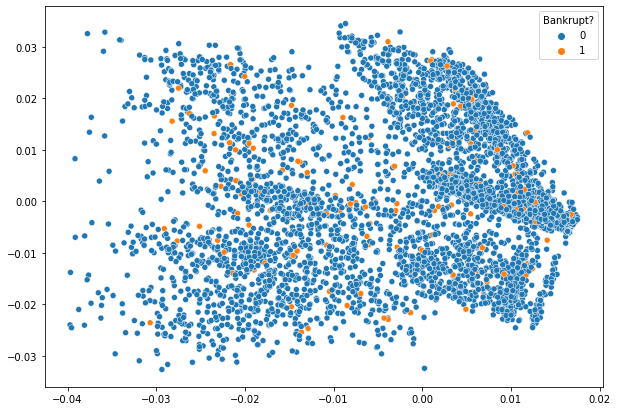

In [ ]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_ica_2[:, 0], y=X_ica_2[:, 1], hue=y_train)
plt.show()

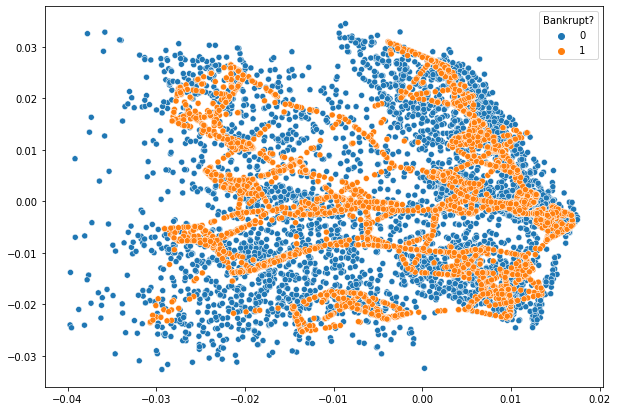

In [ ]:
X_ica_2_smote, y_ica_2_smote = SMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_ica_2, y_train)
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_ica_2_smote[:, 0], y=X_ica_2_smote[:, 1], hue=y_ica_2_smote)
plt.show()

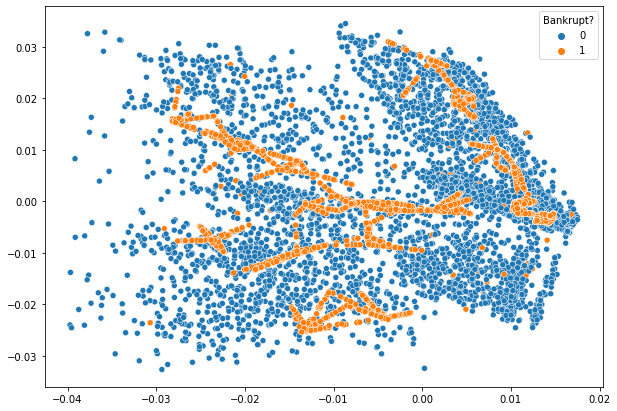

In [ ]:
X_ica_2_smote, y_ica_2_smote = SVMSMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_ica_2, y_train)
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_ica_2_smote[:, 0], y=X_ica_2_smote[:, 1], hue=y_ica_2_smote)
plt.show()

- 3 components

In [ ]:
ica_3 = FastICA(n_components=3, random_state=42)
ica_3.fit(X_train)
X_ica_3 = ica_3.transform(X_train)

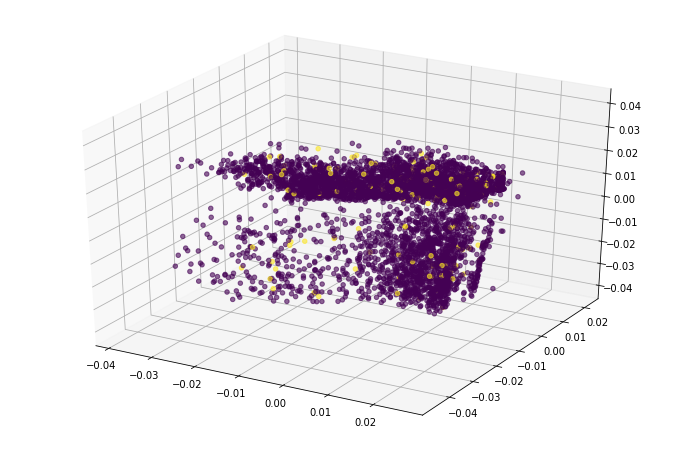

In [ ]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection='3d')

sctt = ax.scatter3D(X_ica_3[:, 0], X_ica_3[:, 1], X_ica_3[:, 2],
                      c = y_train, alpha=0.6)
plt.show()

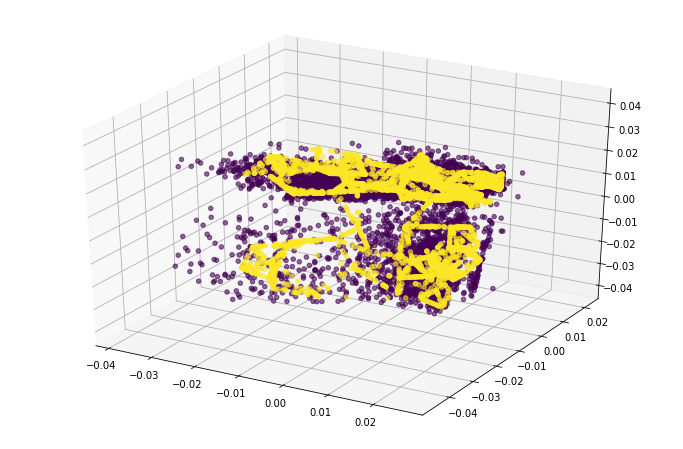

In [ ]:
X_ica_3_smote, y_ica_3_smote = SMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_ica_3, y_train)
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection='3d')

sctt = ax.scatter3D(X_ica_3_smote[:, 0], X_ica_3_smote[:, 1], X_ica_3_smote[:, 2],
                      c = y_ica_3_smote, alpha=0.6)
plt.show()

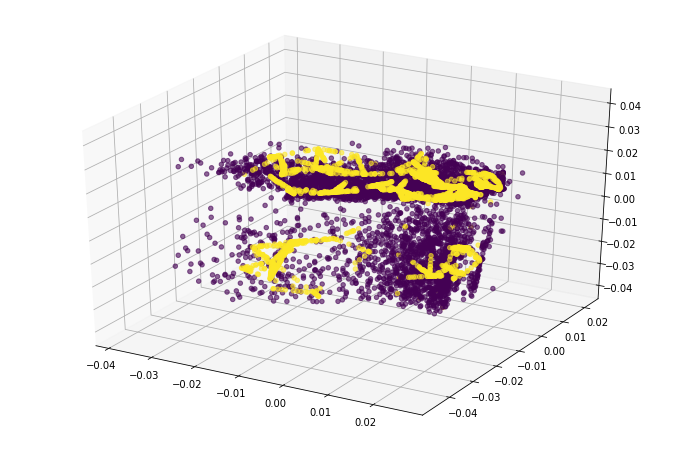

In [ ]:
X_ica_3_smote, y_ica_3_smote = SVMSMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_ica_3, y_train)
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection='3d')

sctt = ax.scatter3D(X_ica_3_smote[:, 0], X_ica_3_smote[:, 1], X_ica_3_smote[:, 2],
                      c = y_ica_3_smote, alpha=0.6)
plt.show()

##### Manifold methods

###### Kernel PCA

In [ ]:
kernel_pca = ('kernel_pca', KernelPCA(random_state=42))
param_grid['kernel_pca__n_components'] = list(range(5, 95, 5)) + [94]
param_grid['kernel_pca__kernel'] = ['linear', 'poly', 'rbf', 'sigmoid', 'cosine', 'precomputed']

- 2 components

In [ ]:
kernel_pca_2 = KernelPCA(n_components=2, random_state=42, kernel='cosine')
kernel_pca_2.fit(X_train)
X_kernel_pca_2 = kernel_pca_2.transform(X_train)

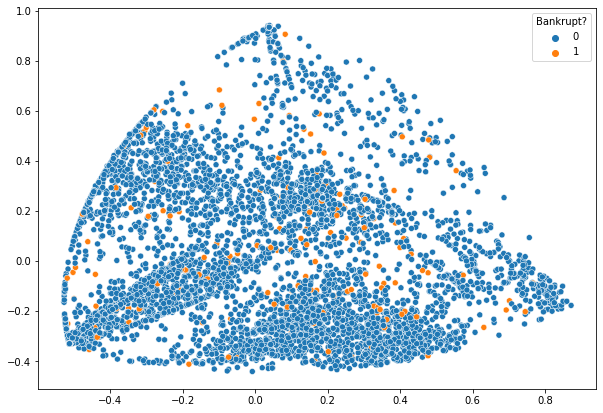

In [ ]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_kernel_pca_2[:, 0], y=X_kernel_pca_2[:, 1], hue=y_train)
plt.show()

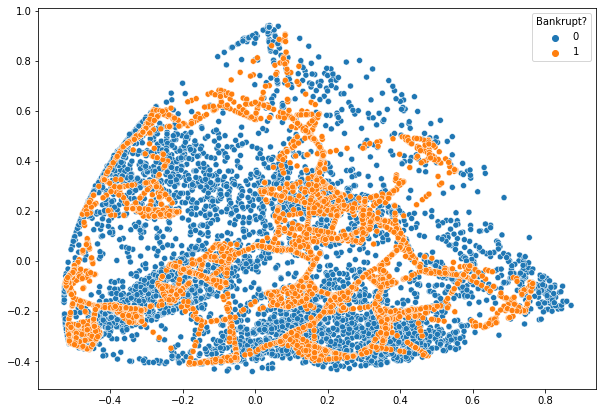

In [ ]:
X_kernel_pca_2_smote, y_kernel_pca_2_smote = SMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_kernel_pca_2, y_train)
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_kernel_pca_2_smote[:, 0], y=X_kernel_pca_2_smote[:, 1], hue=y_kernel_pca_2_smote)
plt.show()

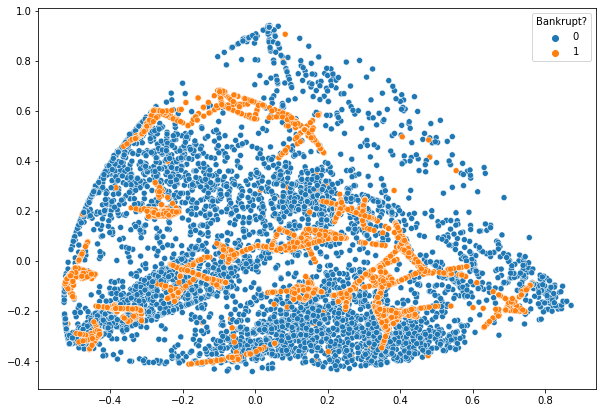

In [ ]:
X_kernel_pca_2_smote, y_kernel_pca_2_smote = SVMSMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_kernel_pca_2, y_train)
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_kernel_pca_2_smote[:, 0], y=X_kernel_pca_2_smote[:, 1], hue=y_kernel_pca_2_smote)
plt.show()

- 3 components

In [ ]:
kernel_pca_3 = KernelPCA(n_components=3, random_state=42, kernel='cosine')
kernel_pca_3.fit(X_train)
X_kernel_pca_3 = kernel_pca_3.transform(X_train)

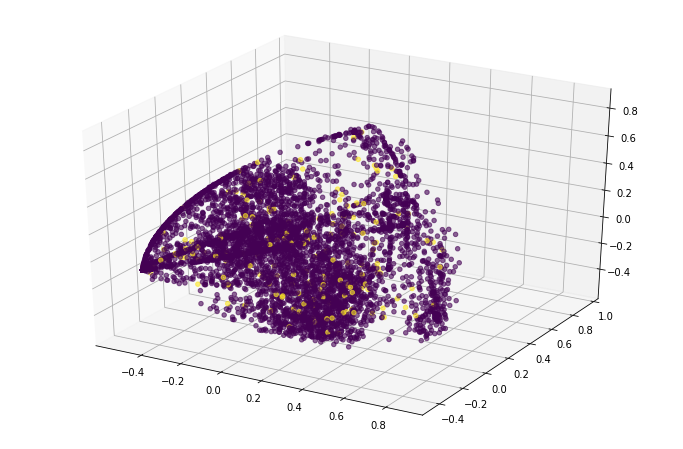

In [ ]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection='3d')

sctt = ax.scatter3D(X_kernel_pca_3[:, 0], X_kernel_pca_3[:, 1], X_kernel_pca_3[:, 2],
                      c = y_train, alpha=0.6)
plt.show()

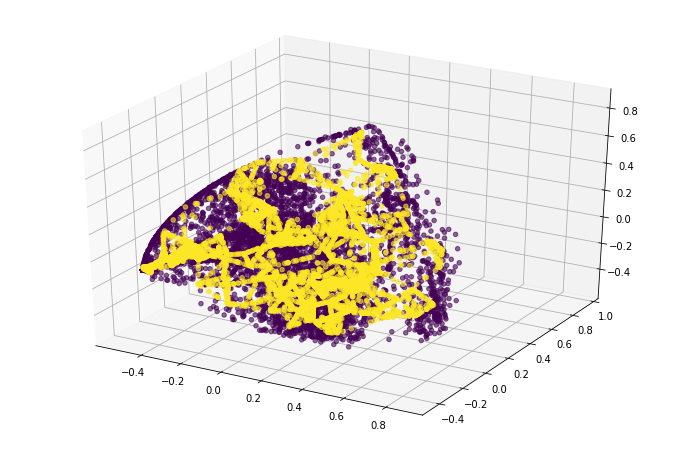

In [ ]:
X_kernel_pca_3_smote, y_kernel_pca_3_smote = SMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_kernel_pca_3, y_train)
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection='3d')

sctt = ax.scatter3D(X_kernel_pca_3_smote[:, 0], X_kernel_pca_3_smote[:, 1], X_kernel_pca_3_smote[:, 2],
                      c = y_kernel_pca_3_smote, alpha=0.6)
plt.show()

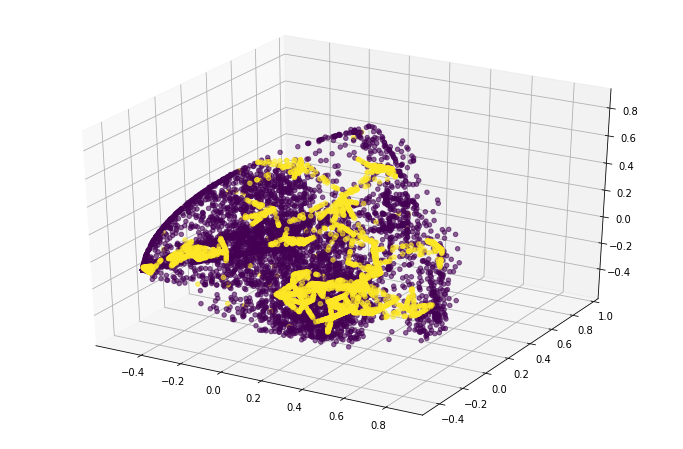

In [ ]:
X_kernel_pca_3_smote, y_kernel_pca_3_smote = SVMSMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_kernel_pca_3, y_train)
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection='3d')

sctt = ax.scatter3D(X_kernel_pca_3_smote[:, 0], X_kernel_pca_3_smote[:, 1], X_kernel_pca_3_smote[:, 2],
                      c = y_kernel_pca_3_smote, alpha=0.6)
plt.show()

###### Isometric Mapping

- 2 components

In [ ]:
iso = ('iso', Isomap())
param_grid['iso__n_components'] = list(range(5, 95, 5)) + [94]
param_grid['iso__n_neighbors'] = [3, 5, 10, 12, 15]
#param_grid['iso__eigen_solver'] = ['auto', 'arpack', 'dense']
#param_grid['iso__neighbors_algorithm'] = ['auto', 'brute', 'kd_tree', 'ball_tree']

In [ ]:
iso_2 = Isomap(n_components=2, n_jobs=-1)
iso_2.fit(X_train)
X_iso_2 = iso_2.transform(X_train)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_isomap.py:304: UserWarning: The number of connected components of the neighbors graph is 2 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/usr/local/lib/python3.7/dist-packages/scipy/sparse/_index.py:84: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])


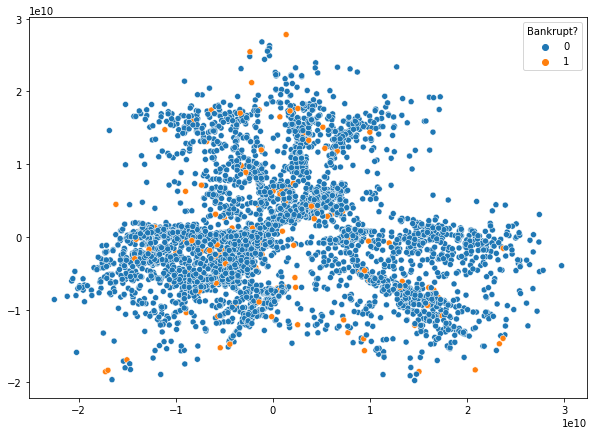

In [ ]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_iso_2[:, 0], y=X_iso_2[:, 1], hue=y_train)
plt.show()

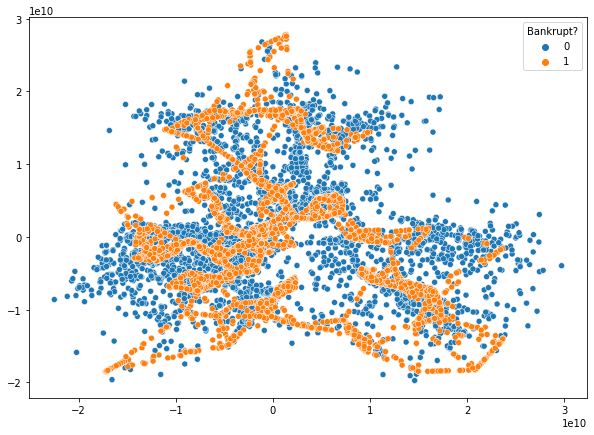

In [ ]:
X_iso_2_smote, y_iso_2_smote = SMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_iso_2, y_train)
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_iso_2_smote[:, 0], y=X_iso_2_smote[:, 1], hue=y_iso_2_smote)
plt.show()

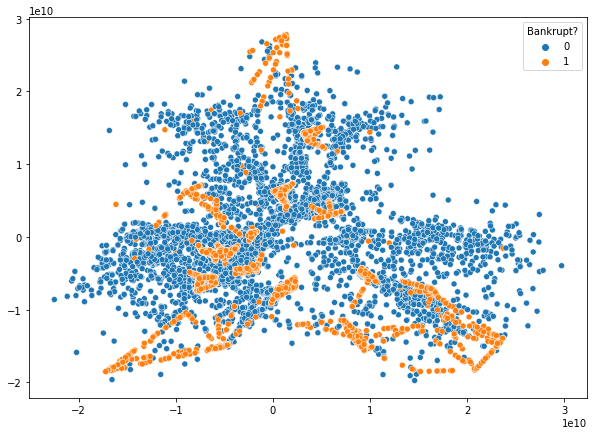

In [ ]:
X_iso_2_smote, y_iso_2_smote = SVMSMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_iso_2, y_train)
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_iso_2_smote[:, 0], y=X_iso_2_smote[:, 1], hue=y_iso_2_smote)
plt.show()

- 3 components

In [ ]:
iso_3 = Isomap(n_components=3, n_jobs=-1)
iso_3.fit(X_train)
X_iso_3 = iso_3.transform(X_train)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_isomap.py:304: UserWarning: The number of connected components of the neighbors graph is 2 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/usr/local/lib/python3.7/dist-packages/scipy/sparse/_index.py:84: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])


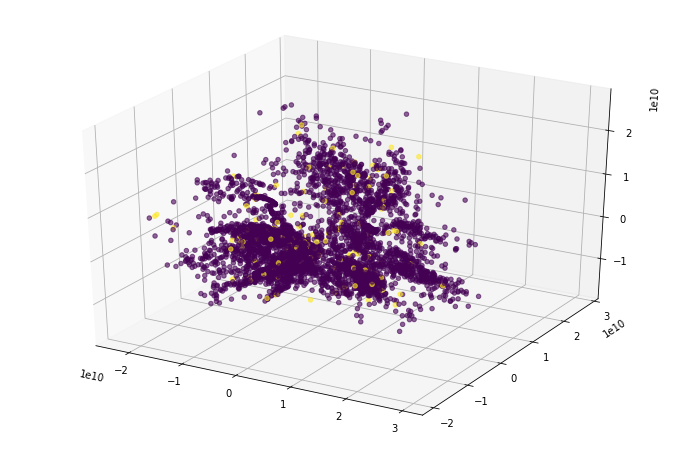

In [ ]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection='3d')

sctt = ax.scatter3D(X_iso_3[:, 0], X_iso_3[:, 1], X_iso_3[:, 2],
                      c = y_train, alpha=0.6)
plt.show()

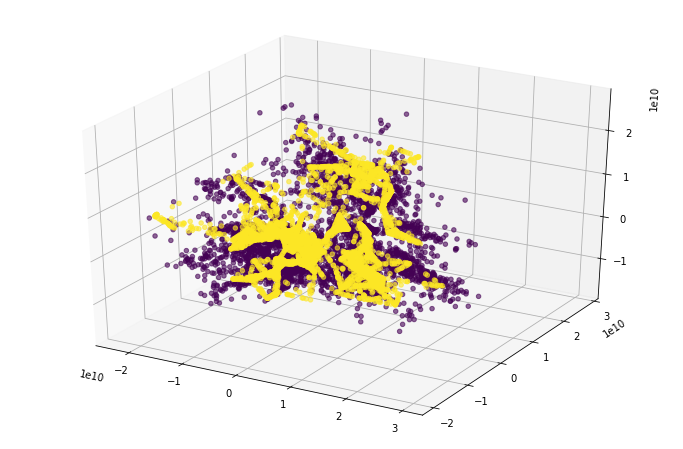

In [ ]:
X_iso_3_smote, y_iso_3_smote = SMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_iso_3, y_train)
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection='3d')

sctt = ax.scatter3D(X_iso_3_smote[:, 0], X_iso_3_smote[:, 1], X_iso_3_smote[:, 2],
                      c = y_iso_3_smote, alpha=0.6)
plt.show()

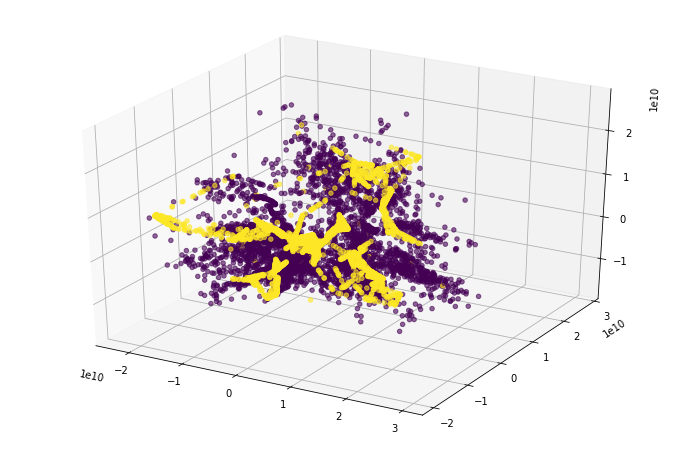

In [ ]:
X_iso_3_smote, y_iso_3_smote = SVMSMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_iso_3, y_train)
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection='3d')

sctt = ax.scatter3D(X_iso_3_smote[:, 0], X_iso_3_smote[:, 1], X_iso_3_smote[:, 2],
                      c = y_iso_3_smote, alpha=0.6)
plt.show()

###### Distributed Stochastic Neighbor Embedding (t-SNE)

- 2 components

In [ ]:
tsne = ('tsne', TSNE(random_state=42))
param_grid['tsne__n_components'] = list(range(5, 95, 5)) + [94]
param_grid['tsne__learning_rate'] = list(range(10, 1000, 40))

In [ ]:
tsne_2 = TSNE(n_components=2, random_state=42, n_jobs=-1)
X_tsne_2 = tsne_2.fit_transform(X_train)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


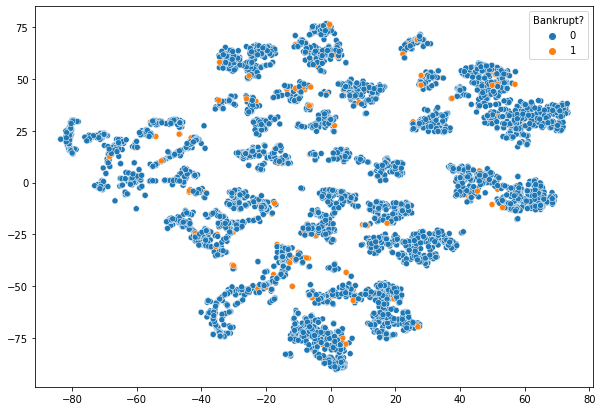

In [ ]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_tsne_2[:, 0], y=X_tsne_2[:, 1], hue=y_train)
plt.show()

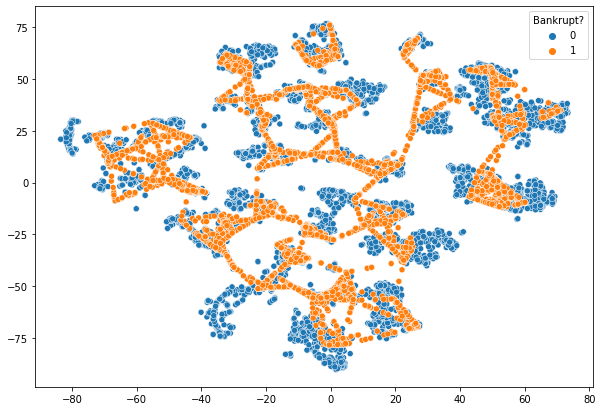

In [ ]:
X_tsne_2_smote, y_tsne_2_smote = SMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_tsne_2, y_train)
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_tsne_2_smote[:, 0], y=X_tsne_2_smote[:, 1], hue=y_tsne_2_smote)
plt.show()

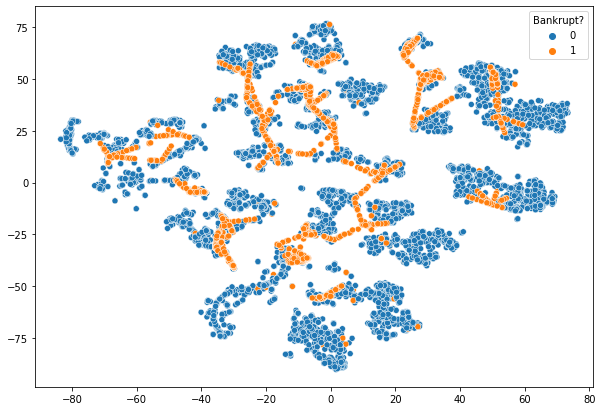

In [ ]:
X_tsne_2_smote, y_tsne_2_smote = SVMSMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_tsne_2, y_train)
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_tsne_2_smote[:, 0], y=X_tsne_2_smote[:, 1], hue=y_tsne_2_smote)
plt.show()

- 3 components

In [ ]:
tsne_3 = TSNE(n_components=3, random_state=42, n_jobs=-1)
X_tsne_3 = tsne_3.fit_transform(X_train)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


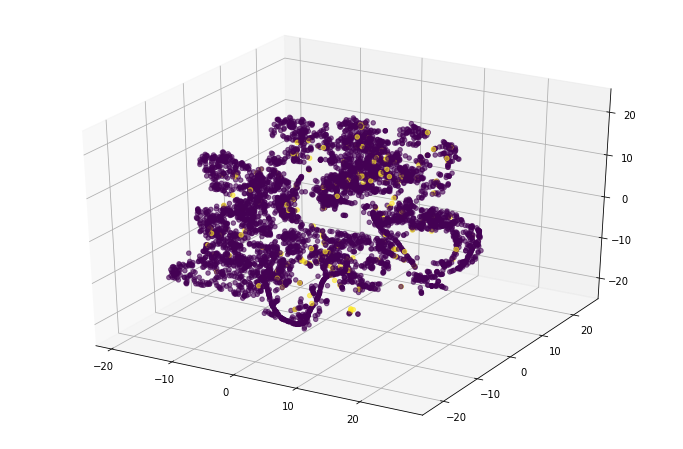

In [ ]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection='3d')

sctt = ax.scatter3D(X_tsne_3[:, 0], X_tsne_3[:, 1], X_tsne_3[:, 2],
                      c = y_train, alpha=0.6)
plt.show()

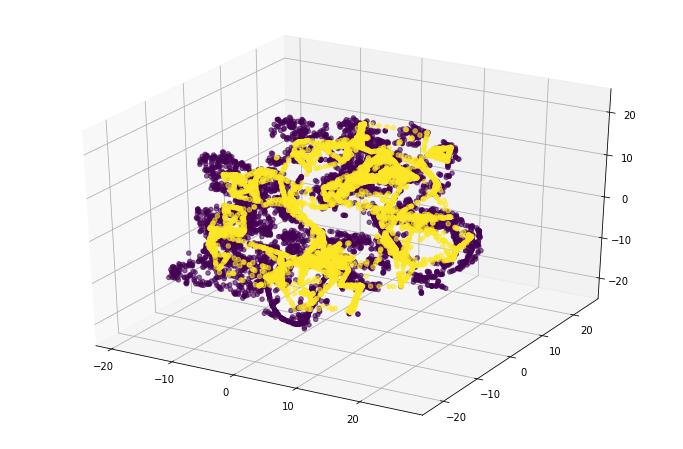

In [ ]:
X_tsne_3_smote, y_tsne_3_smote = SMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_tsne_3, y_train)
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection='3d')

sctt = ax.scatter3D(X_tsne_3_smote[:, 0], X_tsne_3_smote[:, 1], X_tsne_3_smote[:, 2],
                      c = y_tsne_3_smote, alpha=0.6)
plt.show()

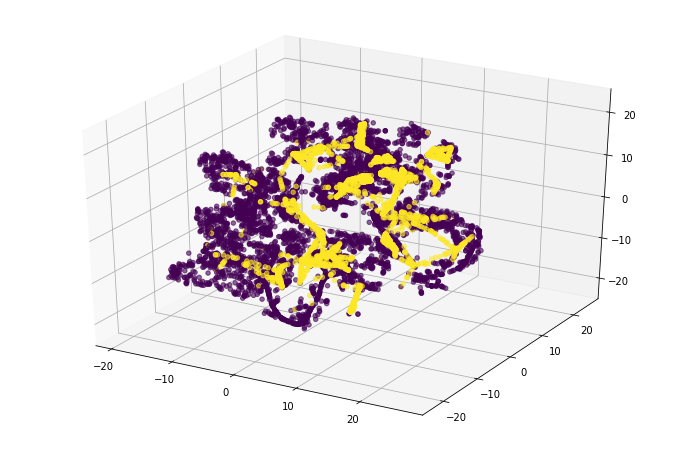

In [ ]:
X_tsne_3_smote, y_tsne_3_smote = SVMSMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_tsne_3, y_train)
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection='3d')

sctt = ax.scatter3D(X_tsne_3_smote[:, 0], X_tsne_3_smote[:, 1], X_tsne_3_smote[:, 2],
                      c = y_tsne_3_smote, alpha=0.6)
plt.show()

###### Uniform Manifold Approximation and Projection (UMAP)

In [ ]:
umap_based = ('umap', UMAP(random_state=42))
param_grid['umap__n_components'] = list(range(5, 95, 5)) + [94]
param_grid['umap__n_neighbors'] = [3, 5, 10, 15, 20]
param_grid['umap__min_dist'] = [0.0, 0.1, 0.25, 0.5, 0.8, 0.99]
param_grid['umap__metric'] = ['manhattan', 'mahalanobis', 'wminkowski', 'seuclidean', 'cosine', 'correlation']

- 2 components

In [ ]:
umap_2 = UMAP(n_components=2, random_state=42, n_jobs=-1)
X_umap_2 = umap_2.fit_transform(X_train)

/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


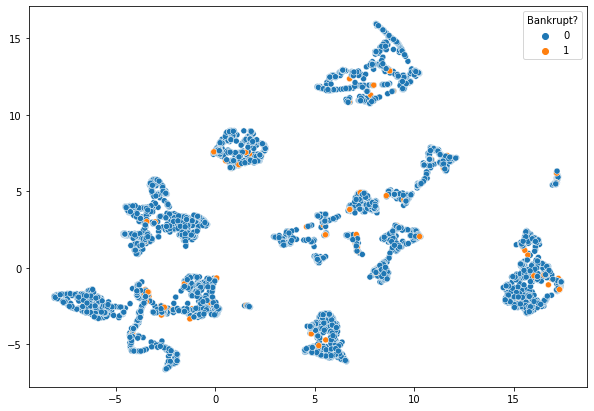

In [ ]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_umap_2[:, 0], y=X_umap_2[:, 1], hue=y_train)
plt.show()

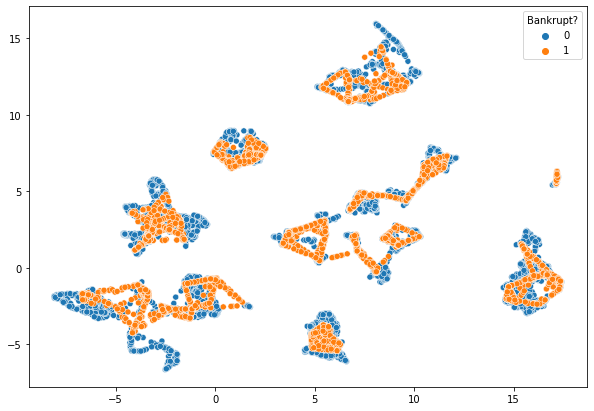

In [ ]:
X_umap_2_smote, y_umap_2_smote = SMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_umap_2, y_train)
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_umap_2_smote[:, 0], y=X_umap_2_smote[:, 1], hue=y_umap_2_smote)
plt.show()

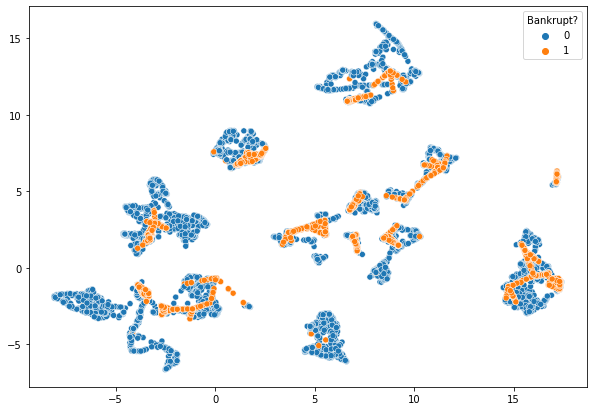

In [ ]:
X_umap_2_smote, y_umap_2_smote = SVMSMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_umap_2, y_train)
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_umap_2_smote[:, 0], y=X_umap_2_smote[:, 1], hue=y_umap_2_smote)
plt.show()

- 3 components

In [ ]:
umap_3 = UMAP(n_components=3, random_state=42, n_jobs=-1)
X_umap_3 = umap_3.fit_transform(X_train)

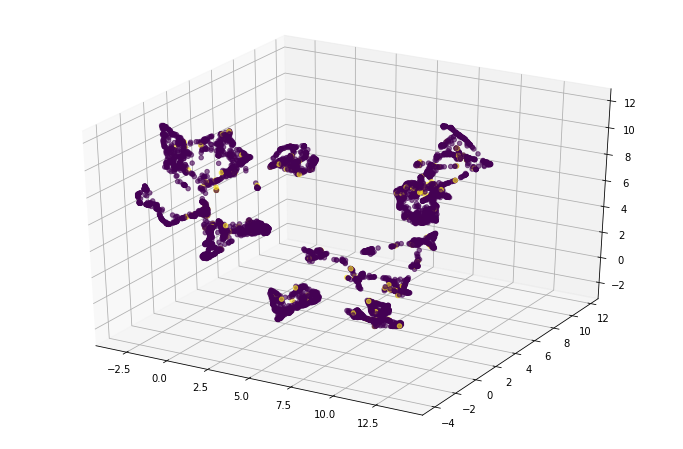

In [ ]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection='3d')

sctt = ax.scatter3D(X_umap_3[:, 0], X_umap_3[:, 1], X_umap_3[:, 2],
                      c = y_train, alpha=0.6)
plt.show()

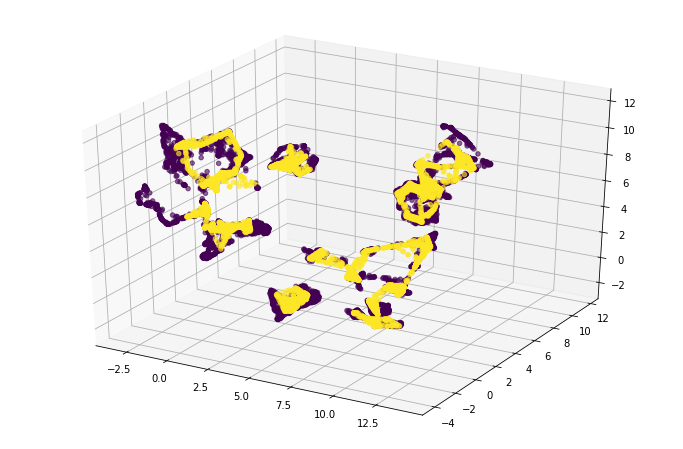

In [ ]:
X_umap_3_smote, y_umap_3_smote = SMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_umap_3, y_train)
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection='3d')

sctt = ax.scatter3D(X_umap_3_smote[:, 0], X_umap_3_smote[:, 1], X_umap_3_smote[:, 2],
                      c = y_umap_3_smote, alpha=0.6)
plt.show()

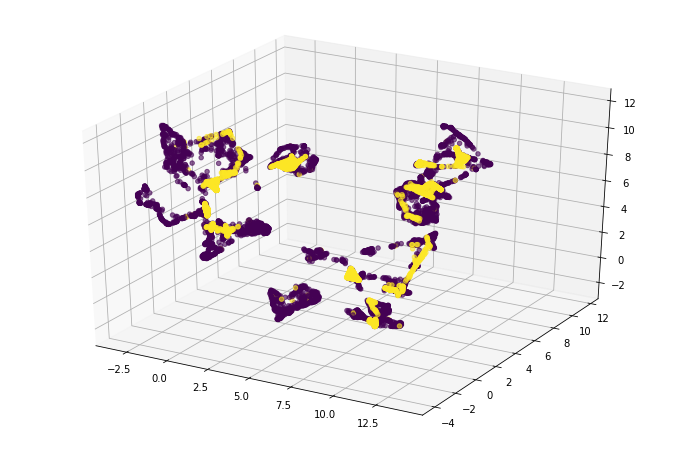

In [ ]:
X_umap_3_smote, y_umap_3_smote = SVMSMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_umap_3, y_train)
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection='3d')

sctt = ax.scatter3D(X_umap_3_smote[:, 0], X_umap_3_smote[:, 1], X_umap_3_smote[:, 2],
                      c = y_umap_3_smote, alpha=0.6)
plt.show()

###### Locally Linear Embedding

In [ ]:
lle = ('lle', LocallyLinearEmbedding(random_state=42))
param_grid['lle__n_components'] = list(range(5, 95, 5)) + [94]
param_grid['lle__n_neighbors'] = [3, 5, 10, 15, 20]
#param_grid['lle__eigen_solver'] = ['auto', 'arpack', 'dense']
#param_grid['lle__neighbors_algorithm']  = ['auto', 'brute', 'kd_tree', 'ball_tree']

- 2 components

In [ ]:
lle_2 = LocallyLinearEmbedding(n_components=2, random_state=42, n_jobs=-1)
X_lle_2 = lle_2.fit_transform(X_train)

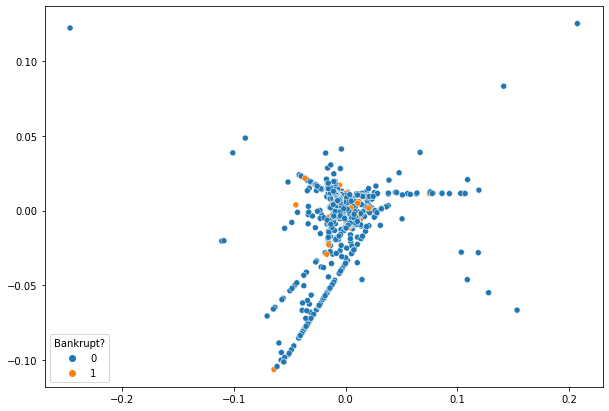

In [ ]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_lle_2[:, 0], y=X_lle_2[:, 1], hue=y_train)
plt.show()

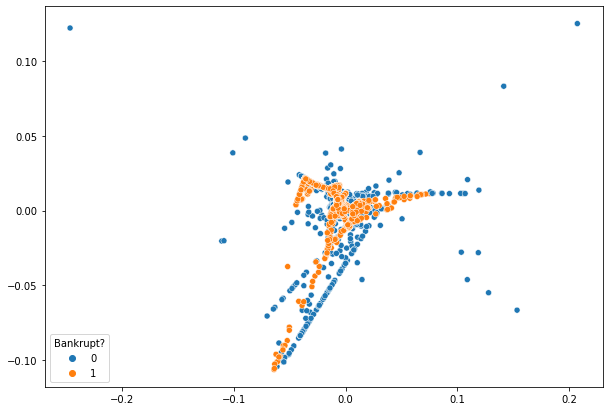

In [ ]:
X_lle_2_smote, y_lle_2_smote = SMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_lle_2, y_train)
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_lle_2_smote[:, 0], y=X_lle_2_smote[:, 1], hue=y_lle_2_smote)
plt.show()

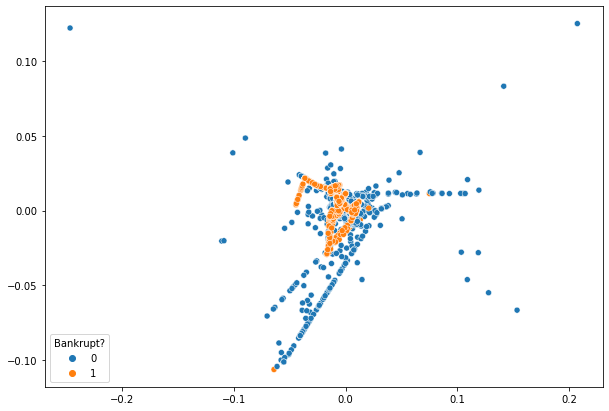

In [ ]:
X_lle_2_smote, y_lle_2_smote = SVMSMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_lle_2, y_train)
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_lle_2_smote[:, 0], y=X_lle_2_smote[:, 1], hue=y_lle_2_smote)
plt.show()

- 3 components

In [ ]:
lle_3 = LocallyLinearEmbedding(n_components=3, random_state=42, n_jobs=-1)
X_lle_3 = lle_3.fit_transform(X_train)

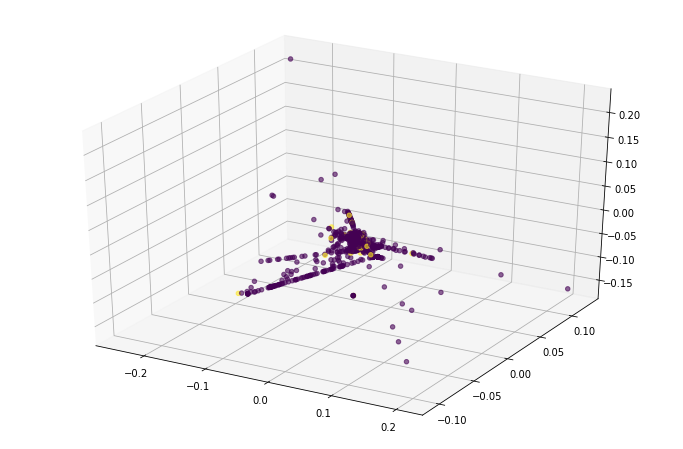

In [ ]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection='3d')

sctt = ax.scatter3D(X_lle_3[:, 0], X_lle_3[:, 1], X_lle_3[:, 2],
                      c = y_train, alpha=0.6)
plt.show()

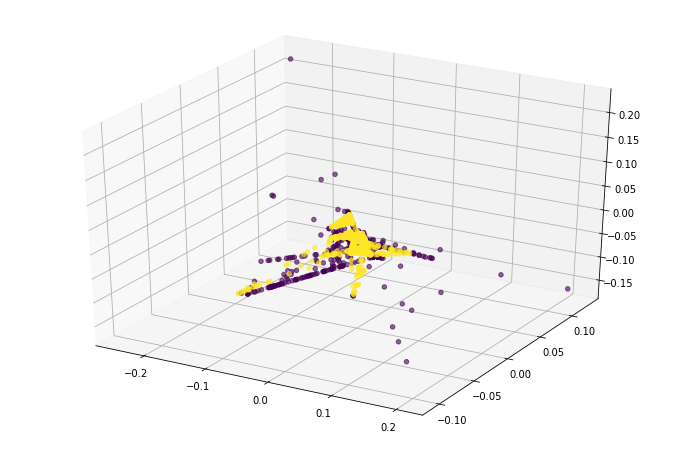

In [ ]:
X_lle_3_smote, y_lle_3_smote = SMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_lle_3, y_train)
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection='3d')

sctt = ax.scatter3D(X_lle_3_smote[:, 0], X_lle_3_smote[:, 1], X_lle_3_smote[:, 2],
                      c = y_lle_3_smote, alpha=0.6)
plt.show()

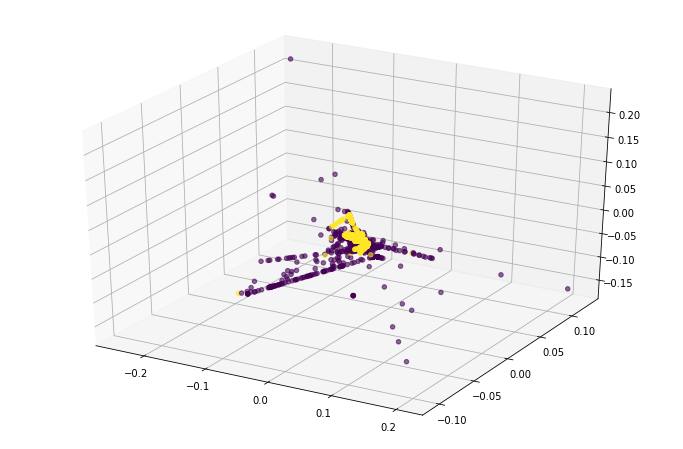

In [ ]:
X_lle_3_smote, y_lle_3_smote = SVMSMOTE(sampling_strategy=1.0, random_state=42).fit_resample(X_lle_3, y_train)
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection='3d')

sctt = ax.scatter3D(X_lle_3_smote[:, 0], X_lle_3_smote[:, 1], X_lle_3_smote[:, 2],
                      c = y_lle_3_smote, alpha=0.6)
plt.show()

#### 4.2.2 Feature Selection

##### Backward Elimination

In [ ]:
from yellowbrick.model_selection import feature_importances

estimator = XGBClassifier(objective= 'binary:logistic', random_state=42)
selector = RFE(estimator, n_features_to_select=3, step=1)
selector.fit(X, y)
X_selected = selector.transform(X)

In [ ]:
print('Data with selected features')
print(pd.DataFrame(X_selected).head())

print('\n\nFEATUERS SELECTED\n\n')
print(selector.support_)

print('\n\nRANKING OF FEATURES\n\n')
print(selector.ranking_)

Data with selected features
          0         1         2
0  0.169141  0.000327  0.390284
1  0.208944  0.000443  0.376760
2  0.180581  0.000396  0.379093
3  0.193722  0.000382  0.379743
4  0.212537  0.000439  0.375025


FEATUERS SELECTED


[False False False False False False False False False False False False
 False False False False False False  True False False False False False
 False False False False False  True False False False False False False
 False False False  True False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False]


RANKING OF FEATURES


[15 43  4 33 78 31 37 76  5 39 49 21 13 10 72 14 88 84  1 28 74 50 16 68
 20 59 24 85 45  1 30 83 47  6 19  7  9 89 61  1 80 67 18 58 65 25 41 38
 46 66 27 48 54

##### Forward Elimination

In [ ]:
X_selected = SelectKBest(f_classif, k=3).fit_transform(X, y)

# Let's see F-vlues for each feature
print('F-values: ', f_classif(X,y)[0])
print()
print('Data with selected features')
print(pd.DataFrame(X_selected).head())

F-values:  [4.97535121e+02 5.93228629e+02 5.49202093e+02 6.89187554e+01
 6.80891088e+01 3.60046611e-04 4.94483704e-01 5.34838360e-01
 1.87734346e+00 4.80452787e-01 2.52276733e-01 4.00521439e+00
 3.58770440e+01 3.62784529e+00 8.30443372e+01 1.91736866e+02
 1.91893599e+02 1.90273698e+02 3.45267517e+02 4.12096205e+01
 1.50081075e-01 1.40388750e+02 2.88185465e+02 1.43235885e-03
 1.56872485e+00 9.74554136e+00 9.25427512e+00 6.02518992e-01
 1.34841658e+01 2.92192096e+01 1.93781500e+00 1.80193666e+01
 3.33336591e-02 4.28320538e+00 4.89968973e-02 1.03378029e+00
 4.55091151e+02 4.55091151e+02 1.95215130e+00 2.19303339e+02
 3.40073045e+01 1.38500753e+02 3.07823235e+02 3.88506635e+01
 3.15889105e+01 1.54062607e-01 2.92973843e-01 1.29042565e-02
 3.63398317e+01 3.03323612e+00 1.07712008e+01 5.92711410e+01
 5.45508987e-02 2.63987646e+02 5.12499829e+01 1.37238238e+01
 6.90398135e+01 9.96226941e-02 4.16436074e+01 2.68012458e+02
 4.07461815e+01 2.47740445e-02 4.60719630e-03 2.95323127e+00
 1.51024877e+

/usr/local/lib/python3.7/dist-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [93] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/feature_selection/_univariate_selection.py:113: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw
/usr/local/lib/python3.7/dist-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [93] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/feature_selection/_univariate_selection.py:113: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


##### Random forests

Feature importances:  [0.01234345 0.02146795 0.0195586  0.00169815 0.00242399 0.0027765
 0.01893017 0.00438358 0.01933811 0.02655734 0.00288121 0.00261728
 0.         0.00626716 0.         0.01549758 0.05821346 0.02325931
 0.0753454  0.00087752 0.00303751 0.00014958 0.03103909 0.00121063
 0.00100502 0.00162531 0.00201896 0.00080987 0.00126185 0.08729239
 0.00389342 0.0021859  0.00095431 0.01043821 0.01276518 0.02865186
 0.02021811 0.02253174 0.00306198 0.05248771 0.00058626 0.00364154
 0.03502966 0.00151738 0.00014929 0.00200886 0.00057975 0.00124026
 0.00246488 0.00051099 0.00125167 0.008708   0.00121028 0.00748464
 0.00296207 0.00377268 0.01320782 0.00341433 0.00631878 0.01120847
 0.00221832 0.00724279 0.         0.00304042 0.01911645 0.01414784
 0.00056197 0.00231909 0.01722882 0.00682417 0.0005293  0.0003979
 0.0018492  0.00147362 0.00301677 0.00052912 0.00158261 0.00983095
 0.00699131 0.00313019 0.00371028 0.00124861 0.00793925 0.00908137
 0.         0.02848431 0.00211523 0.004531

Text(0.5, 1.0, 'Visualizing Important Features')

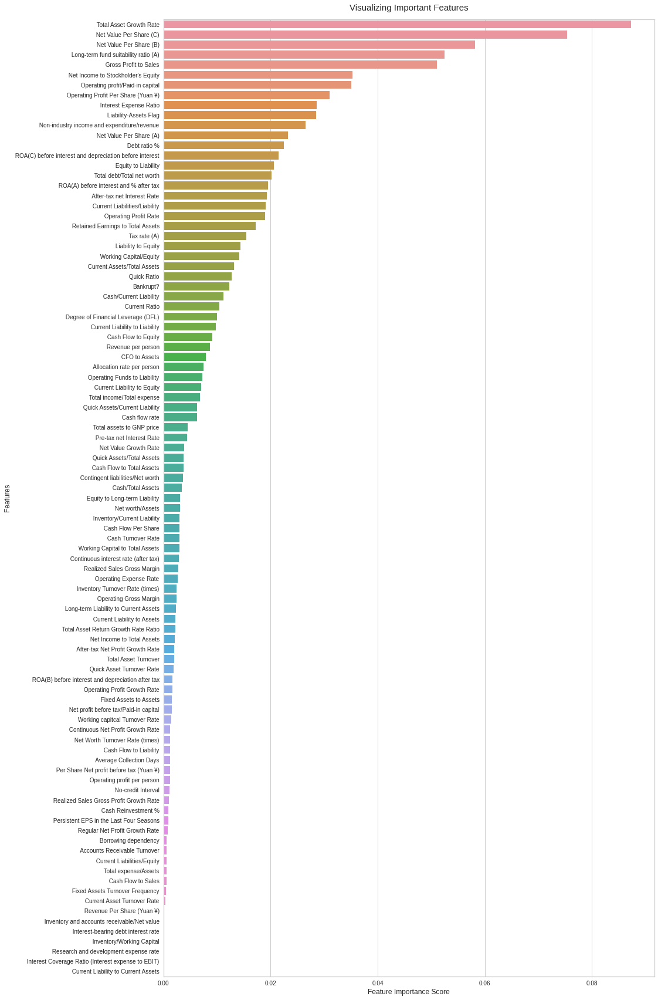

In [ ]:
rf = RandomForestClassifier(n_estimators=100, max_depth=3,
                                 bootstrap=True, n_jobs=-1,
                                 random_state=0)
rf.fit(X_train, y_train)

feature_imp = pd.Series(rf.feature_importances_, index=bank_data.columns).sort_values(ascending=False)

print('Feature importances: ', rf.feature_importances_)

plt.figure(figsize=(15, 30))
sns.barplot(x=feature_imp, y=feature_imp.index)
plt.xlabel('Feature Importance Score', fontsize=12)
plt.ylabel('Features', fontsize=12)
plt.title("Visualizing Important Features", fontsize=15, pad=15)

## 5. Building pipeline

### Models

In [ ]:
rf = ('rf', RandomForestClassifier(random_state=42))

In [ ]:
xgb = ('xgb', XGBClassifier(objective= 'binary:logistic', random_state=42))
#param_grid['xgb__max_depth'] = range (2, 16, 1)
#param_grid['xgb__learning_rate'] = [0.01, 0.1]
#param_grid['xgb__n_estimators'] = range(100, 1001, 50)
#param_grid['xgb__subsample'] = np.arange(0.8, 1.01, 0.05)
#param_grid['xgb__colsample_bytree'] = np.arange(0.3, 0.501, 0.05)
#param_grid['xgb__gamma'] = [0, 1, 5]

### Pipeline

In [ ]:
param_grid = {}

In [ ]:
# Metric
f2_scorer = make_scorer(fbeta_score, beta=2)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=2, random_state=42)

In [ ]:
# Testing components of pipeline to obtain best model
pipe = Pipeline(steps=[svm_smote, xgb])

In [ ]:
# Grid Search
search = GridSearchCV(pipe, param_grid, scoring=f2_scorer, cv=cv, verbose=4, return_train_score=True)

## 6. Training and Evaluation

In [13]:
def plot_search_result(search, x_plot):
  df = pd.DataFrame(search.cv_results_)
  
  plt.figure(figsize=(15, 14))

  plt.subplot(2, 1, 1)
  
  train_y_plot = df['mean_train_score']
  train_y_std_plot = df['std_train_score']
  test_y_plot = df['mean_test_score']
  test_y_std_plot = df['std_test_score']

  plt.errorbar(x_plot, train_y_plot, train_y_std_plot, linestyle='-', marker='o',label='train')
  plt.errorbar(x_plot, test_y_plot, test_y_std_plot, linestyle='--', marker='o',label='test')
  plt.xticks(x_plot, x_plot)
  plt.xlabel('n_components')
  plt.ylabel('f2 score')
  plt.title('f2 score vs n_components')
  plt.legend(loc='best')

  plt.subplot(2, 1, 2)

  mean_fit_time = df['mean_fit_time']
  std_fit_time = df['std_fit_time']
  plt.errorbar(x_plot, mean_fit_time, std_fit_time, linestyle='-', marker='o')
  plt.xticks(x_plot, x_plot)
  plt.xlabel('n_components')
  plt.ylabel('time')
  plt.title('fit_time vs n_components')

  plt.show()

In [14]:
def plot_learning_curve(
    estimator,
    title,
    X,
    y,
    axes=None,
    ylim=None,
    cv=None,
    n_jobs=None,
    train_sizes=np.linspace(0.1, 1.0, 5),
):
    if axes is None:
        _, axes = plt.subplots(1, 3, figsize=(20, 5))

    axes[0].set_title(title)
    if ylim is not None:
        axes[0].set_ylim(*ylim)
    axes[0].set_xlabel("Training examples")
    axes[0].set_ylabel("Score")

    train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(
        estimator,
        X,
        y,
        cv=cv,
        n_jobs=n_jobs,
        train_sizes=train_sizes,
        scoring=f2_scorer,
        return_times=True,
    )
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    fit_times_mean = np.mean(fit_times, axis=1)
    fit_times_std = np.std(fit_times, axis=1)

    # Plot learning curve
    axes[0].grid()
    axes[0].fill_between(
        train_sizes,
        train_scores_mean - train_scores_std,
        train_scores_mean + train_scores_std,
        alpha=0.1,
        color="r",
    )
    axes[0].fill_between(
        train_sizes,
        test_scores_mean - test_scores_std,
        test_scores_mean + test_scores_std,
        alpha=0.1,
        color="g",
    )
    axes[0].plot(
        train_sizes, train_scores_mean, "o-", color="r", label="Training score"
    )
    axes[0].plot(
        train_sizes, test_scores_mean, "o-", color="g", label="Cross-validation score"
    )
    axes[0].legend(loc="best")

    # Plot n_samples vs fit_times
    axes[1].grid()
    axes[1].plot(train_sizes, fit_times_mean, "o-")
    axes[1].fill_between(
        train_sizes,
        fit_times_mean - fit_times_std,
        fit_times_mean + fit_times_std,
        alpha=0.1,
    )
    axes[1].set_xlabel("Training examples")
    axes[1].set_ylabel("fit_times")
    axes[1].set_title("Scalability of the model")

    # Plot fit_time vs score
    fit_time_argsort = fit_times_mean.argsort()
    fit_time_sorted = fit_times_mean[fit_time_argsort]
    test_scores_mean_sorted = test_scores_mean[fit_time_argsort]
    test_scores_std_sorted = test_scores_std[fit_time_argsort]
    axes[2].grid()
    axes[2].plot(fit_time_sorted, test_scores_mean_sorted, "o-")
    axes[2].fill_between(
        fit_time_sorted,
        test_scores_mean_sorted - test_scores_std_sorted,
        test_scores_mean_sorted + test_scores_std_sorted,
        alpha=0.1,
    )
    axes[2].set_xlabel("fit_times") 
    axes[2].set_ylabel("Score")
    axes[2].set_title("Performance of the model")

    return plt

### Baseline model (SVM_SMOTE + XGBoost)

In [ ]:
search.fit(X_train, y_train)

Fitting 10 folds for each of 1 candidates, totalling 10 fits
[CV 1/10] END .............., score=(train=0.787, test=0.500) total time=   6.4s
[CV 2/10] END .............., score=(train=0.763, test=0.508) total time=   4.3s
[CV 3/10] END .............., score=(train=0.817, test=0.447) total time=   4.3s
[CV 4/10] END .............., score=(train=0.777, test=0.538) total time=   7.2s
[CV 5/10] END .............., score=(train=0.824, test=0.518) total time=   8.5s
[CV 6/10] END .............., score=(train=0.806, test=0.543) total time=  14.0s
[CV 7/10] END .............., score=(train=0.826, test=0.371) total time=  14.2s
[CV 8/10] END .............., score=(train=0.803, test=0.576) total time=   7.7s
[CV 9/10] END .............., score=(train=0.791, test=0.419) total time=   5.8s
[CV 10/10] END ............., score=(train=0.772, test=0.513) total time=   4.3s


GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=2, n_splits=5, random_state=42),
             estimator=Pipeline(steps=[('svm_smote',
                                        SVMSMOTE(random_state=42,
                                                 sampling_strategy=1.0)),
                                       ('xgb',
                                        XGBClassifier(random_state=42))]),
             param_grid={}, return_train_score=True,
             scoring=make_scorer(fbeta_score, beta=2), verbose=4)

In [ ]:
keeping_columns = ['params', 'mean_train_score', 'std_train_score', 'mean_test_score', 'std_test_score', 'mean_fit_time', 'std_fit_time']
df = pd.DataFrame(search.cv_results_)
df = df[keeping_columns].sort_values(by='mean_test_score', ascending=False)
df

,params,mean_train_score,std_train_score,mean_test_score,std_test_score,mean_fit_time,std_fit_time
0,{},0.796521,0.021053,0.493508,0.059278,7.658048,3.488105


In [ ]:
print("Best parameter (CV score=%0.3f):" % search.best_score_)

Best parameter (CV score=0.494):


In [ ]:
best_model = search.best_estimator_
print(best_model)

Pipeline(steps=[('svm_smote', SVMSMOTE(random_state=42, sampling_strategy=1.0)),
                ('xgb', XGBClassifier(random_state=42))])


In [ ]:
# Prediction
y_pred = best_model.predict(X_test)
y_score = best_model.predict_proba(X_test)[:, 1]

In [ ]:
# Evaluation
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.97      0.98      1320
           1       0.42      0.59      0.49        44

    accuracy                           0.96      1364
   macro avg       0.70      0.78      0.73      1364
weighted avg       0.97      0.96      0.96      1364

[[1284   36]
 [  18   26]]


In [ ]:
#print(f1_score(y_test, y_pred))
#print(roc_auc_score(y_test, y_pred))

print(fbeta_score(y_test, y_pred, beta=2.0))
precision, recall, thresholds = precision_recall_curve(y_test, y_score)
print(auc(recall, precision))

0.5462184873949579
0.530737932072711


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


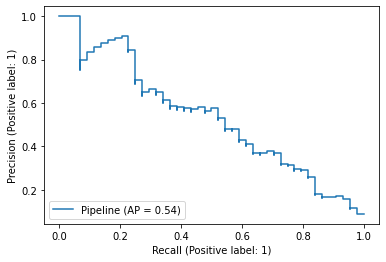

In [ ]:
disp = plot_precision_recall_curve(best_model, X_test, y_test)

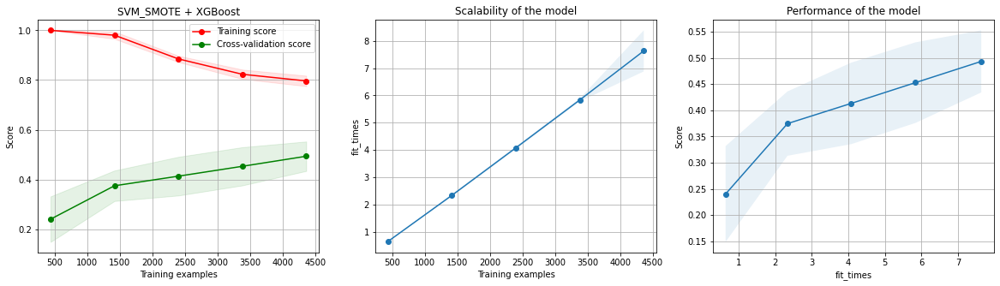

In [ ]:
title = "SVM_SMOTE + XGBoost"
plot_learning_curve(best_model, title, X_train, y_train, cv=cv, n_jobs=-1)
plt.show()

### PCA + SVM_SMOTE + XGBoost

In [ ]:
param_grid = {}

In [ ]:
pca = ('pca', PCA(random_state=42))
param_grid['pca__n_components'] = list(range(10, 91, 10))
#param_grid['pca__svd_solver'] = ['auto', 'full', 'arpack', 'randomized']
#param_grid['pca__n_oversamples'] = [5, 8, 10, 12, 15, 20]
#param_grid['pca__power_iteration_normalizer'] = ['auto', 'QR', 'LU', 'none']

In [ ]:
pipe = Pipeline(steps=[pca, svm_smote, xgb])

In [ ]:
search = GridSearchCV(pipe, param_grid, scoring=f2_scorer, cv=cv, verbose=4, return_train_score=True)

In [ ]:
search.fit(X_train, y_train)

Fitting 10 folds for each of 9 candidates, totalling 90 fits
[CV 1/10] END pca__n_components=10;, score=(train=0.419, test=0.263) total time=   1.0s
[CV 2/10] END pca__n_components=10;, score=(train=0.438, test=0.210) total time=   1.0s
[CV 3/10] END pca__n_components=10;, score=(train=0.424, test=0.143) total time=   1.0s
[CV 4/10] END pca__n_components=10;, score=(train=0.451, test=0.182) total time=   1.0s
[CV 5/10] END pca__n_components=10;, score=(train=0.445, test=0.172) total time=   1.0s
[CV 6/10] END pca__n_components=10;, score=(train=0.422, test=0.248) total time=   1.0s
[CV 7/10] END pca__n_components=10;, score=(train=0.420, test=0.197) total time=   1.0s
[CV 8/10] END pca__n_components=10;, score=(train=0.450, test=0.250) total time=   1.0s
[CV 9/10] END pca__n_components=10;, score=(train=0.427, test=0.196) total time=   1.0s
[CV 10/10] END pca__n_components=10;, score=(train=0.446, test=0.111) total time=   1.0s
[CV 1/10] END pca__n_components=20;, score=(train=0.447, t

In [ ]:
keeping_columns = ['params', 'mean_train_score', 'std_train_score', 'mean_test_score', 'std_test_score', 'mean_fit_time', 'std_fit_time']
df = pd.DataFrame(search.cv_results_)
df = df[keeping_columns].sort_values(by='mean_test_score', ascending=False)
df

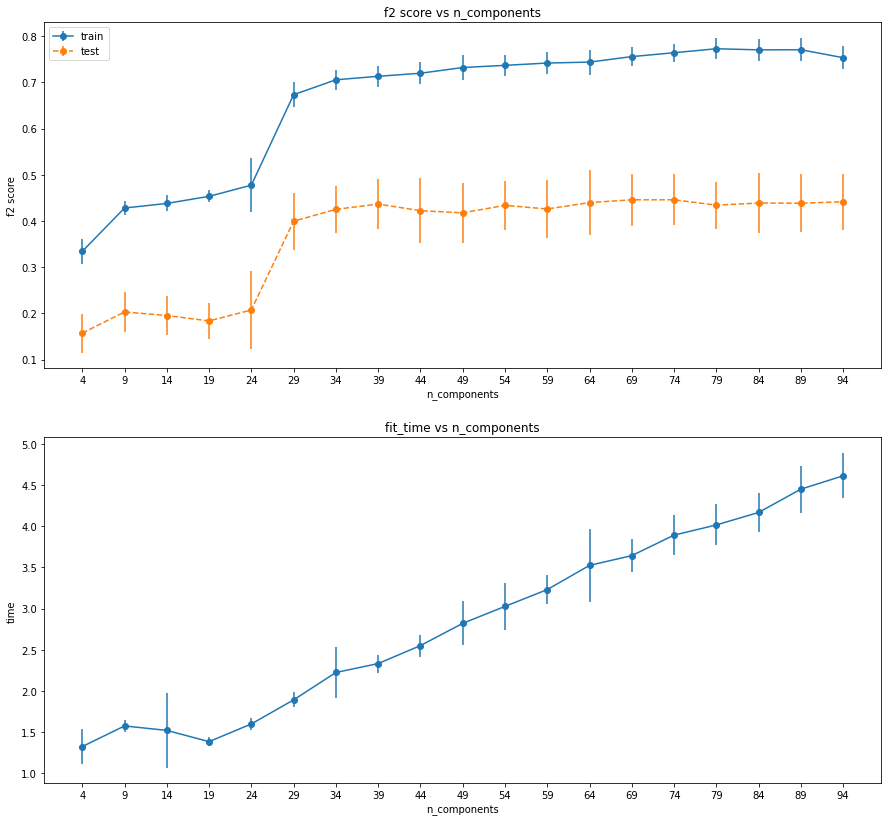

In [ ]:
plot_search_result(search)

### FA + SVM_SMOTE + XGBoost

In [ ]:
param_grid = {}

In [ ]:
fa = ('fa', FactorAnalysis(random_state=42))
param_grid['fa__n_components'] = list(range(5, 95, 5))
#param_grid['fa__svd_method'] = ['lapack', 'randomized']
#param_grid['fa__iterated_power'] = [3, 5, 8, 10, 12] # only used for 'randomized'

In [ ]:
pipe = Pipeline(steps=[fa, svm_smote, xgb])
search = GridSearchCV(pipe, param_grid, scoring=f2_scorer, cv=cv, verbose=4, return_train_score=True)

In [ ]:
search.fit(X_train, y_train)

Fitting 10 folds for each of 18 candidates, totalling 180 fits
[CV 1/10] END fa__n_components=5;, score=(train=0.611, test=0.511) total time=  26.8s
[CV 2/10] END fa__n_components=5;, score=(train=0.632, test=0.546) total time=  27.2s
[CV 3/10] END fa__n_components=5;, score=(train=0.652, test=0.424) total time=  24.8s
[CV 4/10] END fa__n_components=5;, score=(train=0.608, test=0.449) total time=  21.3s
[CV 5/10] END fa__n_components=5;, score=(train=0.630, test=0.445) total time=   3.1s
[CV 6/10] END fa__n_components=5;, score=(train=0.628, test=0.462) total time=   8.2s
[CV 7/10] END fa__n_components=5;, score=(train=0.643, test=0.408) total time=  22.4s
[CV 8/10] END fa__n_components=5;, score=(train=0.619, test=0.553) total time=  30.1s
[CV 9/10] END fa__n_components=5;, score=(train=0.631, test=0.452) total time=  37.5s
[CV 10/10] END fa__n_components=5;, score=(train=0.597, test=0.558) total time=  15.2s
[CV 1/10] END fa__n_components=10;, score=(train=0.388, test=0.245) total ti

GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=2, n_splits=5, random_state=42),
             estimator=Pipeline(steps=[('fa', FactorAnalysis(random_state=42)),
                                       ('svm_smote',
                                        SVMSMOTE(random_state=42,
                                                 sampling_strategy=1.0)),
                                       ('xgb',
                                        XGBClassifier(random_state=42))]),
             param_grid={'fa__n_components': [5, 10, 15, 20, 25, 30, 35, 40, 45,
                                              50, 55, 60, 65, 70, 75, 80, 85,
                                              90]},
             return_train_score=True, scoring=make_scorer(fbeta_score, beta=2),
             verbose=4)

In [ ]:
keeping_columns = ['params', 'mean_train_score', 'std_train_score', 'mean_test_score', 'std_test_score', 'mean_fit_time', 'std_fit_time']
df = pd.DataFrame(search.cv_results_)
df = df[keeping_columns].sort_values(by='mean_test_score', ascending=False)
df

,params,mean_train_score,std_train_score,mean_test_score,std_test_score,mean_fit_time,std_fit_time
0,{'fa__n_components': 5},0.625093,0.015861,0.480930,0.053223,21.643351,9.766903
11,{'fa__n_components': 60},0.723304,0.029839,0.474897,0.078590,3.509002,0.425297
14,{'fa__n_components': 75},0.733868,0.018262,0.465605,0.061256,4.453174,0.497508
9,{'fa__n_components': 50},0.711833,0.020785,0.463893,0.063736,3.182856,0.356290
12,{'fa__n_components': 65},0.711012,0.054505,0.460879,0.065707,3.858037,0.380761
16,{'fa__n_components': 85},0.742409,0.023692,0.459075,0.053626,4.237158,0.614811
17,{'fa__n_components': 90},0.726852,0.026691,0.455036,0.058966,4.090361,0.625555
8,{'fa__n_components': 45},0.684972,0.046113,0.450234,0.051422,2.965817,0.235312
7,{'fa__n_components': 40},0.700100,0.017864,0.438808,0.075245,2.843476,0.230004
6,{'fa__n_components': 35},0.693274,0.019235,0.438323,0.050187,2.434125,0.206552


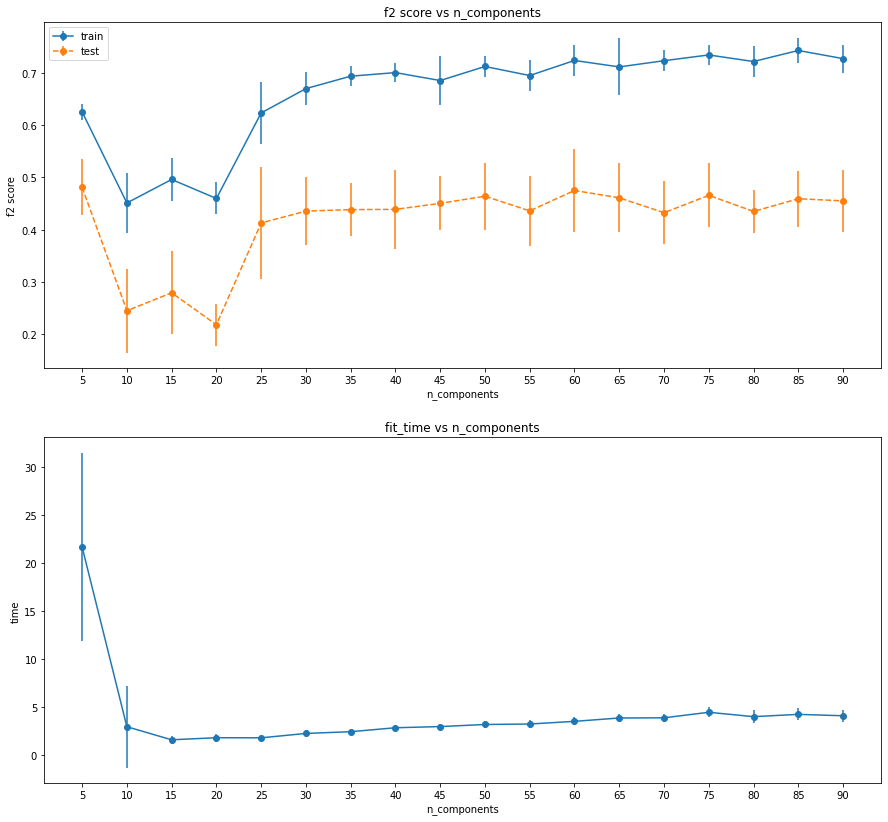

In [ ]:
x_plot = [i for arr in param_grid.values() for i in arr]
plot_search_result(search, x_plot)

In [ ]:
param_grid = {}
fa = ('fa', FactorAnalysis(random_state=42))
param_grid['fa__n_components'] = list(range(3, 15, 2)) + list(range(59, 85, 2))
pipe = Pipeline(steps=[fa, svm_smote, xgb])
search = GridSearchCV(pipe, param_grid, scoring=f2_scorer, cv=cv, verbose=4, return_train_score=True)
search.fit(X_train, y_train)

Fitting 10 folds for each of 19 candidates, totalling 190 fits
[CV 1/10] END fa__n_components=3;, score=(train=0.594, test=0.502) total time=   2.8s
[CV 2/10] END fa__n_components=3;, score=(train=0.583, test=0.511) total time=   3.0s
[CV 3/10] END fa__n_components=3;, score=(train=0.614, test=0.447) total time=   2.8s
[CV 4/10] END fa__n_components=3;, score=(train=0.588, test=0.471) total time=   2.9s
[CV 5/10] END fa__n_components=3;, score=(train=0.599, test=0.453) total time=   7.3s
[CV 6/10] END fa__n_components=3;, score=(train=0.580, test=0.482) total time=   3.6s
[CV 7/10] END fa__n_components=3;, score=(train=0.593, test=0.380) total time=   2.9s
[CV 8/10] END fa__n_components=3;, score=(train=0.573, test=0.547) total time=   3.3s
[CV 9/10] END fa__n_components=3;, score=(train=0.602, test=0.476) total time=   1.9s
[CV 10/10] END fa__n_components=3;, score=(train=0.609, test=0.551) total time=   3.2s
[CV 1/10] END fa__n_components=5;, score=(train=0.611, test=0.511) total tim

/usr/local/lib/python3.7/dist-packages/sklearn/decomposition/_factor_analysis.py:292: ConvergenceWarning: FactorAnalysis did not converge. You might want to increase the number of iterations.
  ConvergenceWarning,


[CV 1/10] END fa__n_components=7;, score=(train=0.623, test=0.482) total time=  35.8s
[CV 2/10] END fa__n_components=7;, score=(train=0.647, test=0.496) total time=  28.1s
[CV 3/10] END fa__n_components=7;, score=(train=0.652, test=0.465) total time=  22.5s
[CV 4/10] END fa__n_components=7;, score=(train=0.668, test=0.471) total time=   9.7s
[CV 5/10] END fa__n_components=7;, score=(train=0.636, test=0.517) total time=  13.2s
[CV 6/10] END fa__n_components=7;, score=(train=0.650, test=0.500) total time=   8.0s
[CV 7/10] END fa__n_components=7;, score=(train=0.661, test=0.407) total time=   8.0s


/usr/local/lib/python3.7/dist-packages/sklearn/decomposition/_factor_analysis.py:292: ConvergenceWarning: FactorAnalysis did not converge. You might want to increase the number of iterations.
  ConvergenceWarning,


[CV 8/10] END fa__n_components=7;, score=(train=0.617, test=0.546) total time=  34.7s
[CV 9/10] END fa__n_components=7;, score=(train=0.656, test=0.434) total time=  12.8s
[CV 10/10] END fa__n_components=7;, score=(train=0.611, test=0.517) total time=  16.1s
[CV 1/10] END fa__n_components=9;, score=(train=0.551, test=0.363) total time=   1.6s
[CV 2/10] END fa__n_components=9;, score=(train=0.581, test=0.464) total time=   5.0s
[CV 3/10] END fa__n_components=9;, score=(train=0.433, test=0.209) total time=   1.0s
[CV 4/10] END fa__n_components=9;, score=(train=0.428, test=0.224) total time=   1.0s
[CV 5/10] END fa__n_components=9;, score=(train=0.437, test=0.285) total time=   1.1s
[CV 6/10] END fa__n_components=9;, score=(train=0.574, test=0.308) total time=   2.4s
[CV 7/10] END fa__n_components=9;, score=(train=0.593, test=0.264) total time=   6.5s
[CV 8/10] END fa__n_components=9;, score=(train=0.408, test=0.206) total time=   1.1s
[CV 9/10] END fa__n_components=9;, score=(train=0.432

GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=2, n_splits=5, random_state=42),
             estimator=Pipeline(steps=[('fa', FactorAnalysis(random_state=42)),
                                       ('svm_smote',
                                        SVMSMOTE(random_state=42,
                                                 sampling_strategy=1.0)),
                                       ('xgb',
                                        XGBClassifier(random_state=42))]),
             param_grid={'fa__n_components': [3, 5, 7, 9, 11, 13, 59, 61, 63,
                                              65, 67, 69, 71, 73, 75, 77, 79,
                                              81, 83]},
             return_train_score=True, scoring=make_scorer(fbeta_score, beta=2),
             verbose=4)

In [ ]:
keeping_columns = ['params', 'mean_train_score', 'std_train_score', 'mean_test_score', 'std_test_score', 'mean_fit_time', 'std_fit_time']
df = pd.DataFrame(search.cv_results_)
df = df[keeping_columns].sort_values(by='mean_test_score', ascending=False)
df

,params,mean_train_score,std_train_score,mean_test_score,std_test_score,mean_fit_time,std_fit_time
2,{'fa__n_components': 7},0.642053,0.018355,0.483533,0.039289,18.886266,10.163725
0,{'fa__n_components': 3},0.593494,0.012390,0.481868,0.047805,3.348295,1.383614
1,{'fa__n_components': 5},0.625093,0.015861,0.480930,0.053223,15.644722,7.067693
15,{'fa__n_components': 77},0.734276,0.034934,0.471097,0.049792,4.153525,0.721510
14,{'fa__n_components': 75},0.733868,0.018262,0.465605,0.061256,4.448405,0.514117
7,{'fa__n_components': 61},0.717280,0.021897,0.461067,0.054353,3.787497,0.738101
9,{'fa__n_components': 65},0.711012,0.054505,0.460879,0.065707,3.841052,0.400013
17,{'fa__n_components': 81},0.738467,0.026391,0.458002,0.073778,4.209770,0.649459
8,{'fa__n_components': 63},0.723431,0.027130,0.457205,0.057893,3.759971,0.459667
6,{'fa__n_components': 59},0.724736,0.035661,0.454361,0.042041,3.867663,0.439838


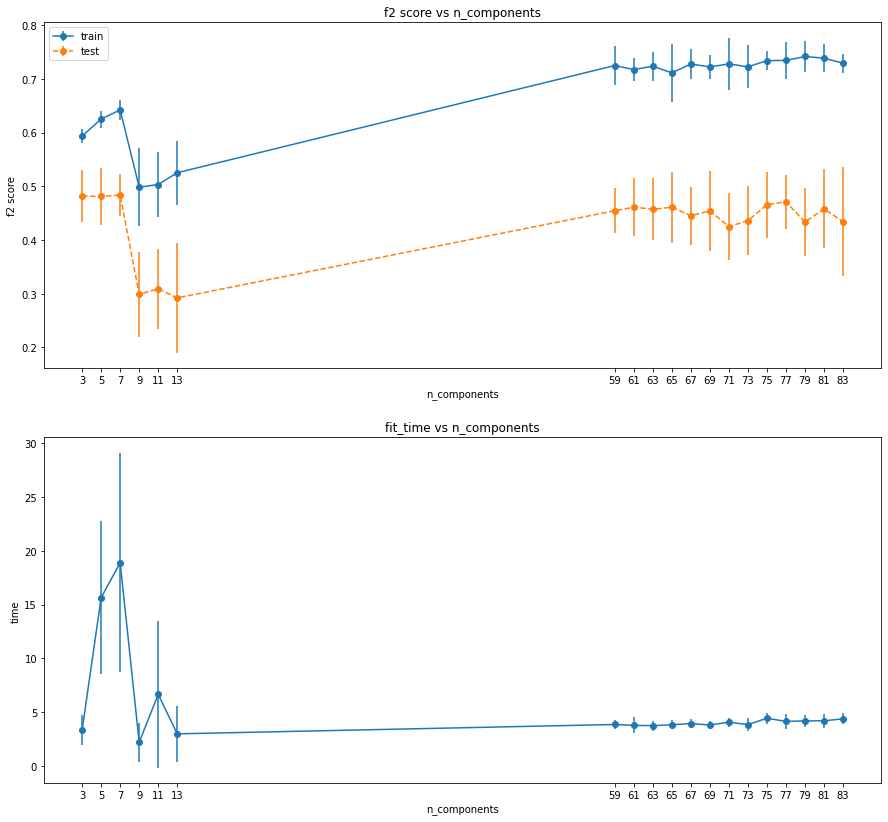

In [ ]:
x_plot = [i for arr in param_grid.values() for i in arr]
plot_search_result(search, x_plot)

In [ ]:
param_grid = {}
fa = ('fa', FactorAnalysis(random_state=42))
param_grid['fa__n_components'] = list(range(3, 10, 1)) + list(range(75, 81, 1))
pipe = Pipeline(steps=[fa, svm_smote, xgb])
search = GridSearchCV(pipe, param_grid, scoring=f2_scorer, cv=cv, verbose=4, return_train_score=True)
search.fit(X_train, y_train)

Fitting 10 folds for each of 13 candidates, totalling 130 fits
[CV 1/10] END fa__n_components=3;, score=(train=0.594, test=0.502) total time=   3.0s
[CV 2/10] END fa__n_components=3;, score=(train=0.583, test=0.511) total time=   4.4s
[CV 3/10] END fa__n_components=3;, score=(train=0.614, test=0.447) total time=   2.8s
[CV 4/10] END fa__n_components=3;, score=(train=0.588, test=0.471) total time=   3.0s
[CV 5/10] END fa__n_components=3;, score=(train=0.599, test=0.453) total time=   6.7s
[CV 6/10] END fa__n_components=3;, score=(train=0.580, test=0.482) total time=   3.7s
[CV 7/10] END fa__n_components=3;, score=(train=0.593, test=0.380) total time=   3.1s
[CV 8/10] END fa__n_components=3;, score=(train=0.573, test=0.547) total time=   3.4s
[CV 9/10] END fa__n_components=3;, score=(train=0.602, test=0.476) total time=   2.8s
[CV 10/10] END fa__n_components=3;, score=(train=0.609, test=0.551) total time=   3.2s
[CV 1/10] END fa__n_components=4;, score=(train=0.608, test=0.496) total tim

/usr/local/lib/python3.7/dist-packages/sklearn/decomposition/_factor_analysis.py:292: ConvergenceWarning: FactorAnalysis did not converge. You might want to increase the number of iterations.
  ConvergenceWarning,


[CV 1/10] END fa__n_components=7;, score=(train=0.623, test=0.482) total time=  36.5s
[CV 2/10] END fa__n_components=7;, score=(train=0.647, test=0.496) total time=  27.0s
[CV 3/10] END fa__n_components=7;, score=(train=0.652, test=0.465) total time=  22.5s
[CV 4/10] END fa__n_components=7;, score=(train=0.668, test=0.471) total time=   9.4s
[CV 5/10] END fa__n_components=7;, score=(train=0.636, test=0.517) total time=  13.6s
[CV 6/10] END fa__n_components=7;, score=(train=0.650, test=0.500) total time=   8.8s
[CV 7/10] END fa__n_components=7;, score=(train=0.661, test=0.407) total time=   8.9s


/usr/local/lib/python3.7/dist-packages/sklearn/decomposition/_factor_analysis.py:292: ConvergenceWarning: FactorAnalysis did not converge. You might want to increase the number of iterations.
  ConvergenceWarning,


[CV 8/10] END fa__n_components=7;, score=(train=0.617, test=0.546) total time=  36.2s
[CV 9/10] END fa__n_components=7;, score=(train=0.656, test=0.434) total time=  13.0s
[CV 10/10] END fa__n_components=7;, score=(train=0.611, test=0.517) total time=  15.9s
[CV 1/10] END fa__n_components=8;, score=(train=0.398, test=0.198) total time=   1.0s
[CV 2/10] END fa__n_components=8;, score=(train=0.432, test=0.253) total time=   0.9s
[CV 3/10] END fa__n_components=8;, score=(train=0.434, test=0.218) total time=   0.9s
[CV 4/10] END fa__n_components=8;, score=(train=0.414, test=0.163) total time=   0.9s
[CV 5/10] END fa__n_components=8;, score=(train=0.419, test=0.232) total time=   0.9s
[CV 6/10] END fa__n_components=8;, score=(train=0.440, test=0.211) total time=   0.9s
[CV 7/10] END fa__n_components=8;, score=(train=0.425, test=0.161) total time=   1.0s
[CV 8/10] END fa__n_components=8;, score=(train=0.416, test=0.236) total time=   1.0s
[CV 9/10] END fa__n_components=8;, score=(train=0.412

GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=2, n_splits=5, random_state=42),
             estimator=Pipeline(steps=[('fa', FactorAnalysis(random_state=42)),
                                       ('svm_smote',
                                        SVMSMOTE(random_state=42,
                                                 sampling_strategy=1.0)),
                                       ('xgb',
                                        XGBClassifier(random_state=42))]),
             param_grid={'fa__n_components': [3, 4, 5, 6, 7, 8, 9, 75, 76, 77,
                                              78, 79, 80]},
             return_train_score=True, scoring=make_scorer(fbeta_score, beta=2),
             verbose=4)

In [ ]:
keeping_columns = ['params', 'mean_train_score', 'std_train_score', 'mean_test_score', 'std_test_score', 'mean_fit_time', 'std_fit_time']
df = pd.DataFrame(search.cv_results_)
df = df[keeping_columns].sort_values(by='mean_test_score', ascending=False)
df

,params,mean_train_score,std_train_score,mean_test_score,std_test_score,mean_fit_time,std_fit_time
1,{'fa__n_components': 4},0.618573,0.016030,0.489603,0.038972,10.167622,5.316474
3,{'fa__n_components': 6},0.626966,0.016041,0.486485,0.056613,7.271279,8.162121
4,{'fa__n_components': 7},0.642053,0.018355,0.483533,0.039289,19.164353,10.267204
0,{'fa__n_components': 3},0.593494,0.012390,0.481868,0.047805,3.588460,1.127767
2,{'fa__n_components': 5},0.625093,0.015861,0.480930,0.053223,15.777467,7.033407
9,{'fa__n_components': 77},0.734276,0.034934,0.471097,0.049792,4.178559,0.736816
7,{'fa__n_components': 75},0.733868,0.018262,0.465605,0.061256,4.449527,0.484815
8,{'fa__n_components': 76},0.724613,0.024319,0.445056,0.071409,3.960109,0.751225
10,{'fa__n_components': 78},0.725983,0.022615,0.444396,0.063104,4.278896,0.567419
12,{'fa__n_components': 80},0.721291,0.029225,0.434834,0.040588,4.033014,0.688567


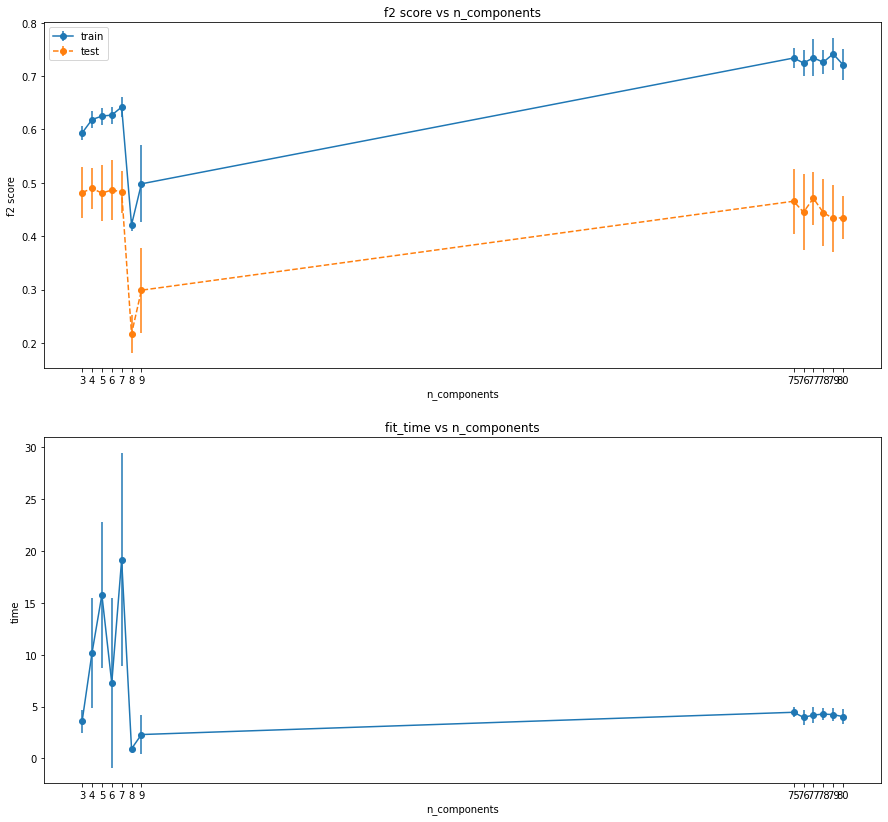

In [ ]:
x_plot = [i for arr in param_grid.values() for i in arr]
plot_search_result(search, x_plot)

### Best models

In [ ]:
param_grid = {}
fa = ('fa', FactorAnalysis(random_state=42))
param_grid['fa__n_components'] = [4]
pipe = Pipeline(steps=[fa, svm_smote, xgb])
search = GridSearchCV(pipe, param_grid, scoring=f2_scorer, cv=cv, verbose=4, return_train_score=True)
search.fit(X_train, y_train)

Fitting 10 folds for each of 1 candidates, totalling 10 fits
[CV 1/10] END fa__n_components=4;, score=(train=0.608, test=0.496) total time=  37.3s
[CV 2/10] END fa__n_components=4;, score=(train=0.619, test=0.489) total time=  24.5s
[CV 3/10] END fa__n_components=4;, score=(train=0.650, test=0.451) total time=  18.4s
[CV 4/10] END fa__n_components=4;, score=(train=0.630, test=0.492) total time=   5.1s
[CV 5/10] END fa__n_components=4;, score=(train=0.603, test=0.458) total time=   2.7s
[CV 6/10] END fa__n_components=4;, score=(train=0.612, test=0.500) total time=   6.8s
[CV 7/10] END fa__n_components=4;, score=(train=0.640, test=0.432) total time=  19.4s
[CV 8/10] END fa__n_components=4;, score=(train=0.604, test=0.585) total time=   6.7s
[CV 9/10] END fa__n_components=4;, score=(train=0.620, test=0.489) total time=  18.5s
[CV 10/10] END fa__n_components=4;, score=(train=0.599, test=0.504) total time=  18.9s


GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=2, n_splits=5, random_state=42),
             estimator=Pipeline(steps=[('fa', FactorAnalysis(random_state=42)),
                                       ('svm_smote',
                                        SVMSMOTE(random_state=42,
                                                 sampling_strategy=1.0)),
                                       ('xgb',
                                        XGBClassifier(random_state=42))]),
             param_grid={'fa__n_components': [4]}, return_train_score=True,
             scoring=make_scorer(fbeta_score, beta=2), verbose=4)

In [ ]:
keeping_columns = ['params', 'mean_train_score', 'std_train_score', 'mean_test_score', 'std_test_score', 'mean_fit_time', 'std_fit_time']
df = pd.DataFrame(search.cv_results_)
df = df[keeping_columns].sort_values(by='mean_test_score', ascending=False)
df

,params,mean_train_score,std_train_score,mean_test_score,std_test_score,mean_fit_time,std_fit_time
0,{'fa__n_components': 4},0.618573,0.01603,0.489603,0.038972,15.822592,10.125177


In [ ]:
print("Best parameter (CV score=%0.3f):" % search.best_score_)
best_model = search.best_estimator_
print(best_model)

Best parameter (CV score=0.490):
Pipeline(steps=[('fa', FactorAnalysis(n_components=4, random_state=42)),
                ('svm_smote', SVMSMOTE(random_state=42, sampling_strategy=1.0)),
                ('xgb', XGBClassifier(random_state=42))])


In [ ]:
y_pred = best_model.predict(X_test)
y_score = best_model.predict_proba(X_test)[:, 1]

In [ ]:
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(fbeta_score(y_test, y_pred, beta=2.0))
precision, recall, thresholds = precision_recall_curve(y_test, y_score)
print(auc(recall, precision))

              precision    recall  f1-score   support

           0       0.99      0.93      0.96      1320
           1       0.26      0.75      0.38        44

    accuracy                           0.92      1364
   macro avg       0.62      0.84      0.67      1364
weighted avg       0.97      0.92      0.94      1364

[[1224   96]
 [  11   33]]
0.5409836065573771
0.34251962806147795


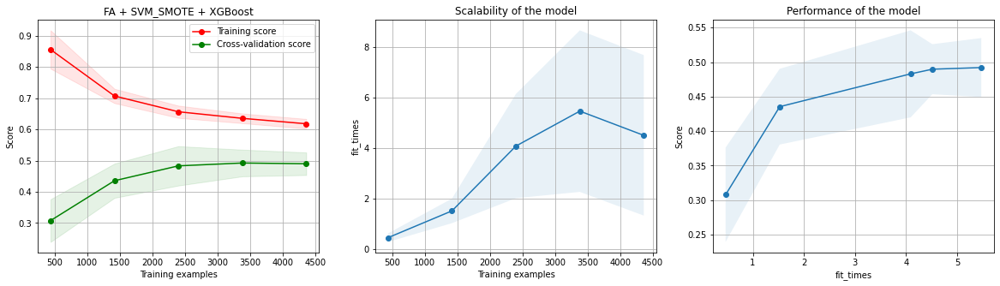

In [ ]:
title = "FA + SVM_SMOTE + XGBoost"
plot_learning_curve(best_model, title, X_train, y_train, cv=cv, n_jobs=-1)
plt.show()

# Result of Experiment

- Best of FA: 
  - n_components = 4
  - test_f2_score: 0.5409836065573771

|index|params|mean\_train_score|std\_train_score|mean\_test_score|std\_test_score|mean\_fit_time|std\_fit_time|
|---|---|---|---|---|---|---|---|
|0|\{'fa__n_components': 4}|0\.6185728774369207|0\.01602962271317152|0\.4896027678756865|0\.03897191665769936|15\.822591781616211|10\.125177376846517|